# GBSV Mini-Challenge 2

## 1. Pattern search in image and signal (LO3)
### 1.1. Correlation in signals

In [1]:
import cv2 
from enum import Enum
from ipywidgets import interact, widgets
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage import morphology
from scipy import signal
from scipy import datasets
import statsmodels.api as sm
import statsmodels 
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border, slic, mark_boundaries
from skimage.measure import label, regionprops
from skimage.color import label2rgb

### 1.1.1 Find a suitable signal containing recurring patterns.
I will use [traffic dataset](https://www.kaggle.com/datasets/fedesoriano/traffic-prediction-dataset) which records the number of vehicles crossing 4 individual junctions in every hour.

In [2]:
traffic = pd.read_csv("data/traffic.csv", header=0, index_col=0)
traffic.head(100)

,Junction,Vehicles,ID
DateTime,,,
2015-11-01 00:00:00,1,15,20151101001
2015-11-01 01:00:00,1,13,20151101011
2015-11-01 02:00:00,1,10,20151101021
2015-11-01 03:00:00,1,7,20151101031
2015-11-01 04:00:00,1,9,20151101041
...,...,...,...
2015-11-04 23:00:00,1,24,20151104231
2015-11-05 00:00:00,1,19,20151105001
2015-11-05 01:00:00,1,20,20151105011


In [3]:
traffic.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48120 entries, 2015-11-01 00:00:00 to 2017-06-30 23:00:00
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   Junction  48120 non-null  int64
 1   Vehicles  48120 non-null  int64
 2   ID        48120 non-null  int64
dtypes: int64(3)
memory usage: 1.5+ MB


The dataset contains 48120 observations with DateTime, Juction, Vehicles, ID. 
-   I will select only the first 2000 data points from the junction 1. This datasize should be sufficient and effitive for this task.
-   Keep only the columns which are relevant to this task: DateTime, Vehicles

In [4]:
# select the first 2000 rows of junction 1
traffic = traffic[traffic['Junction'] == 1][:2000]
# select relevant column
vehicles = traffic[['Vehicles']]
vehicles.index = pd.to_datetime(vehicles.index, format="%Y-%m-%d %H:%M:%S")
vehicles

,Vehicles
DateTime,
2015-11-01 00:00:00,15
2015-11-01 01:00:00,13
2015-11-01 02:00:00,10
2015-11-01 03:00:00,7
2015-11-01 04:00:00,9
...,...
2016-01-23 03:00:00,16
2016-01-23 04:00:00,16
2016-01-23 05:00:00,15


Now visualize the whole 2000 data points, and zoomed in to the first 18 days, as I assume the data should have period of one week. 

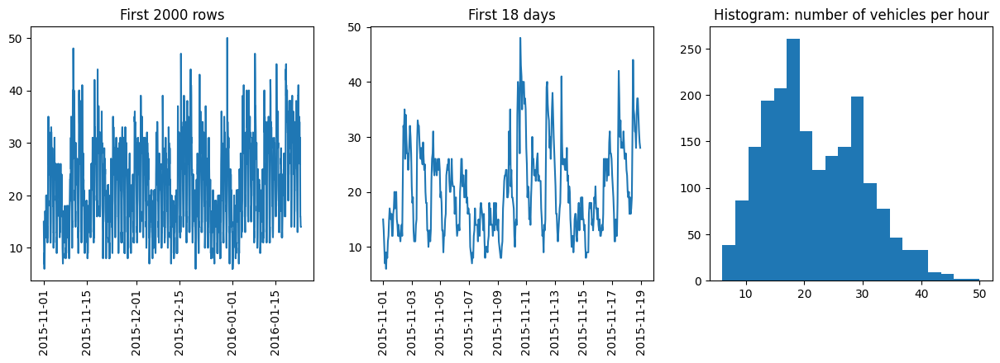

In [5]:
# lineplot of the first 2000 rows and 
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.plot(vehicles)
plt.xticks(rotation=90)
plt.title("First 2000 rows")
plt.subplot(1, 3, 2)
plt.plot(vehicles[:24*18])
plt.xticks(rotation=90)
plt.title("First 18 days")
plt.subplot(1, 3, 3)
plt.hist(vehicles['Vehicles'], bins=20)
plt.title("Histogram: number of vehicles per hour")
plt.show()

-   In the first plot, we could see a clear recurring patterns in the signal, around 4.5 cycles in November 2015. 
-   In the zoomed in lineplot (middle plot) we could better measure that the period is 7 days (5 days with larger amount of vehicles followed by 2 days of less vehicles.) 
-   The histogram reflected the distribution of vehicle counts per hour. There are two peaks, at around 18 and 28.

### 1.1.2 Auto-correlation to analyze the recurring patterns within the signal

<Figure size 1500x400 with 0 Axes>

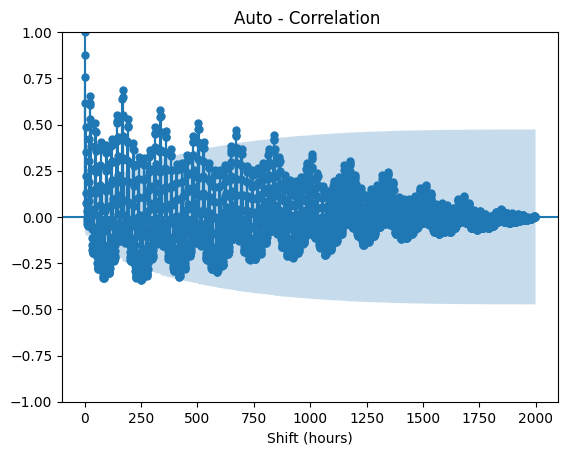

In [6]:
lags = len(vehicles) - 1 # number of lags or shifts, here i use the maximum number of shifts
plt.figure(figsize=(15, 4))
sm.graphics.tsa.plot_acf(vehicles, lags=lags, title=f"Auto - Correlation ") 
plt.xlabel("Shift (hours)")
plt.show()

Result interpretation:


1.  Can the periodicity of the pattern be made visible via auto-correlogram? 
-   Yes, we could see periodicity in the auto-correlogram. By visual control, the period in the auto-correlogram is same as the signal plot in time space.
2.  Discuss the choice of method and parameters as well as the results.
-   The auto correlation graph shows the correlation between the original signal and the shifted signal. N step shift means start from the N-th data point of the original signal. Here each step is one hour.
-   We could see that, with 0 shift, the correlation is 1 (maximum), which means the correlation between the original signal and the shifted signal is identical, this is obvious, because the signal is shifted with 0 steps (not shifted).
-   As the number of shift increases, the correlation decreases. This is because, the signal is shifted with more steps, the difference between the original signal and the shifted signal increases.
-   But when further increase the number of shift, the correlation increases again and will reach a peak. This means, the original signal and the shifted signal are again highly correlated.
-   After the peak, the correlation decreases again, then increases and reach another peak. We could see that the shift size between two neighboring peaks are constant. This means, the original signal is a periodic signal, the number of shifts between two peak correlation is exactly the period of the original signal. When the signal is shifted with exactly one or multiple periods, the correlation will reach a peak.
-   But the correlation will never reach 1 again, because the shifted signal is not anymore same as the original one.

### 1.1.3 Find out signal of interest and try to find it in the original signal via cross-correlation. 

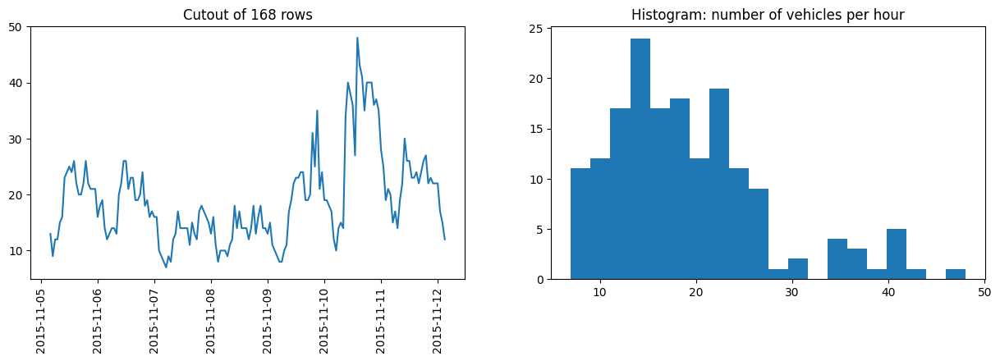

In [7]:
signal_of_interest = vehicles[100:268] # cutout of one week data (168 rows)
plt.figure(figsize=(15, 4)) 
plt.subplot(1, 2, 1)
plt.plot(signal_of_interest)
plt.xticks(rotation=90)
plt.title("Cutout of 168 rows")
plt.subplot(1, 2, 2)
plt.hist(signal_of_interest['Vehicles'], bins=20)

plt.title("Histogram: number of vehicles per hour")
plt.show()

In [8]:
def cor_correlation(signal_full, signal_of_interest, start_, end_, if_plot = True, if_print = True):
    """
    Find out the signal of interest from the original full signal based on the cross-correlation between two signals.
    """
    # scaling both signals based on full signal
    signal_full_scaled = (signal_full - signal_full.mean()) / signal_full.std()
    signal_of_interest_scaled = (signal_of_interest - signal_full.mean()) / signal_full.std()
    # cross-correlation
    corr = signal.correlate(signal_full_scaled, signal_of_interest_scaled, mode='valid').flatten() # mode='valid': no padding
    max_correlation = np.max(corr)
    matching_indices = np.where(corr == max_correlation)[0]

    matching_piece = [signal_full_scaled[index : index + len(signal_of_interest_scaled)] for index in matching_indices]
    # plot
    data_lst = [signal_of_interest,  signal_of_interest_scaled, matching_piece[0], corr]
    title_lst = [f"Signal of interest (indices {start_} - {end_})", "Signal of interest (scaled)", f"Most correlated piece (indices {matching_indices[0]} - {matching_indices[0] + len(signal_of_interest_scaled)})", "Cross-correlation"]
    if if_plot:
        plt.figure(figsize=(15, 2))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.plot(data_lst[i])
            plt.xticks(rotation=90)
            plt.title(title_lst[i])
        plt.show()

    # reverse scaling
    reverse_scaled_matching_piece = matching_piece[0] * signal_full.std() + signal_full.mean()

    # Check if the most correlated piece is the same as the signal of interest
    diff = np.sum(abs(reverse_scaled_matching_piece - signal_of_interest))
    if if_print:
        if  diff < 0.00001:
            print(f"Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of {np.sum(abs(reverse_scaled_matching_piece - signal_of_interest))}")
        else: print(f"Method 1: Perfect match not found!!")
        # method 2: find the most correlated signal piece from the original full signal by the locations returned by the cor_correlation function
        # Then compare the signal piece with the original signal of interest
        if ((start_ == matching_indices[0]) & (end_ == (matching_indices[0] + len(signal_of_interest_scaled)))):
            print("Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest")
        else: print(f"Method 2: Perfect match not found!!")
    return reverse_scaled_matching_piece, (matching_indices[0], matching_indices[0] + len(signal_of_interest_scaled))

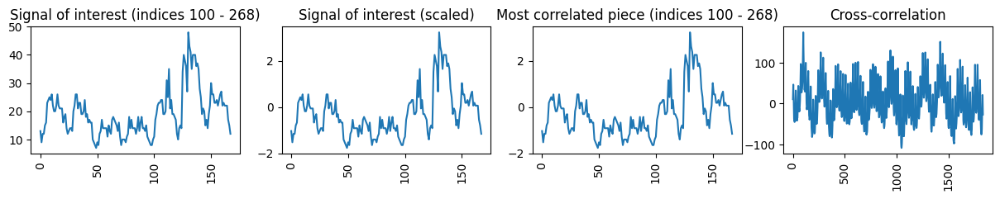

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


In [9]:
full_signal = vehicles['Vehicles'].values   
signal_of_interest = vehicles['Vehicles'][100:268].values
reverse_scaled_matching_piece, locations = cor_correlation(full_signal, signal_of_interest, 100, 268)

Result interpretation:

-   Visually, the most correlated signal piece has the same shape as the first two signals.
-   The cross correlation plot shows the correlation between the scaled full signal and the signal of interest with the same scale, the x-axis is the shift of the full signal, the y-axis is the correlation value between the signal of interest and the full signal at this shift. The correlation graph is periodic with around 170 shifts between two peaks, this means the full signal has a period of 170 shifts, around 170/24 = 7 days. 



**How to know if the most correlated signal piece is identical as the signal of interest, and its position is right?** 

-   Calculate the difference between the signal of interest and the found most correlated piece. Here, the differnce is 0, meaning the two signal pieces are identical.
-   The number of shift steps is the start index of the correlated signal piece in the full signal. If it is same as the target signal start index in the full signal, then the found signal position is also right. 

### 1.1.4 Now make some changes of the signal, check if it still could be found.

#### 1.1.4.1 shift at x-axis.

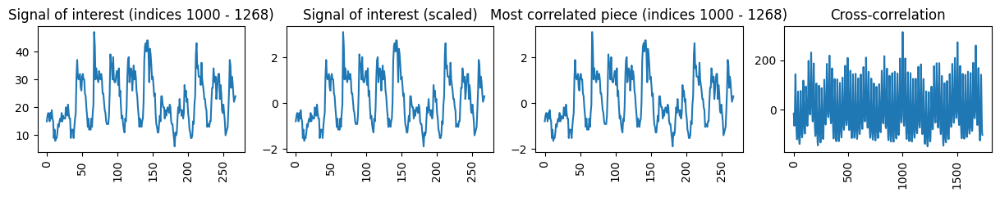

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


In [10]:
# test with another signal with same length but different location
signal_of_interest = vehicles['Vehicles'][1000:1268].values
reverse_scaled_matching_piece, locations = cor_correlation(full_signal, signal_of_interest, 1000,1268)

-   The signal of interest is again found by cross correlation with the original signal.

#### 1.1.4.2 Change the target signal length
Now I would test if a target signal could still be found with another (larger, smaller) length. When does it work, when not?

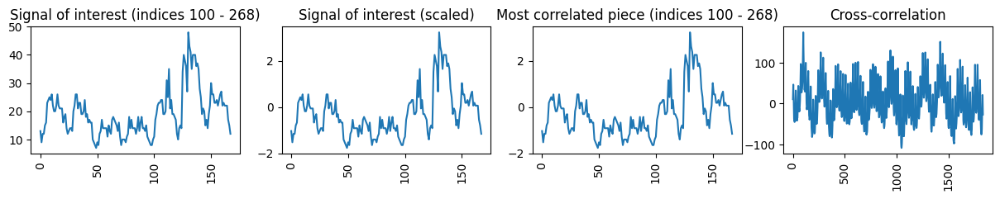

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


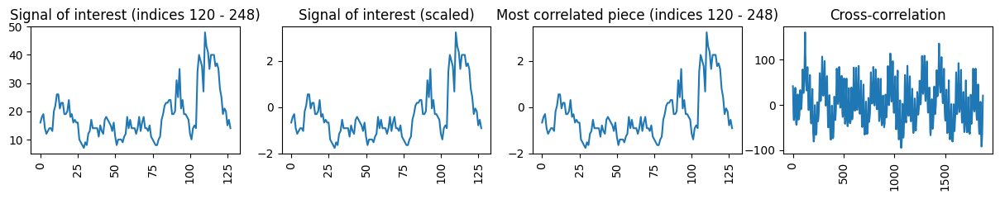

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


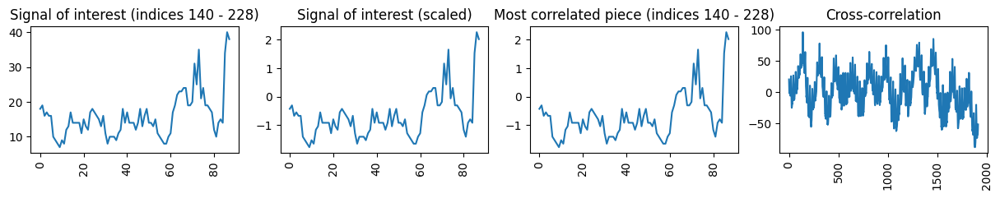

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


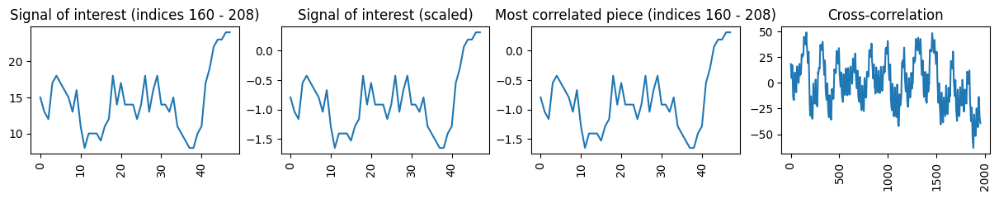

Method 1: Perfect match!! The most correlated piece is the same as the signal of interest, with difference of 0.0
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


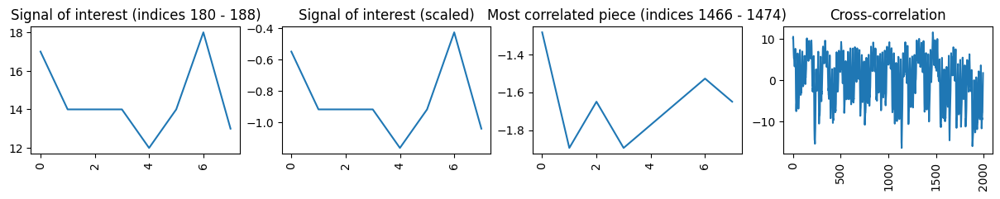

Method 1: Perfect match not found!!
Method 2: Perfect match not found!!


In [11]:
# start with piece between 800:1200, and each time cut 20 rows from both sides
start_ = 100
end_ = 268
step = 20
for i in range((end_-start_)//step):
    start_index = start_ + i*step
    end_index = end_ - i*step
    if start_index < end_index: 
        signal_of_interest = vehicles['Vehicles'][start_index:end_index].values
        reverse_scaled_matching_piece, locations = cor_correlation(full_signal, signal_of_interest, start_index, end_index)


-   In the last two runs, the signal of interest is not found, the lengths of the target signal is 48, 8.
This means, the target signal must have a certain minimal length, so that it could be recognized from the full signal. 

- Now cut out some signal pieces from other positions, and check if they should could be found, and when not.

In [12]:
start_lst = [0,200,400,600,800,1000,1200,1400,1600]
end_lst = [400,600,800,1000,1200,1400,1600,1800,2000]
step = 10
signal_length = []
for n in range(len(start_lst)):
    start_ = start_lst[n]
    end_ = end_lst[n]
    for i in range((end_-start_)//step):
        start_index = start_ + i*step
        end_index = end_ - i*step
        if start_index < end_index: 
            signal_of_interest = vehicles['Vehicles'][start_index:end_index].values
            reverse_scaled_matching_piece, locations = cor_correlation(full_signal, signal_of_interest, start_index, end_index, if_plot = False, if_print = False)
            if np.sum(abs(reverse_scaled_matching_piece - signal_of_interest)) > 0.00001:
                signal_length.append(end_index-start_index)
                break
print(f"In the cases where perfect match are not found, the length of the target signal is \n{signal_length}")

In the cases where perfect match are not found, the length of the target signal is 
[20, 220, 300, 340, 120, 60, 40, 120, 160]


In the cases, where the target signals were not found, mostly have length shorter than the signal period (168), except three length 220, 300, 340. This could be due to some specific seasons or holiday weeks, the traffic counts have a larger period than normal weeks, therefore larger signal length is needed to identify the target piece from the full data. 

#### 1.1.4.3 scale the amplitude
As I have shown in every step, scaling the signal amplitude will not affect the cross-correlation result.
#### 1.1.4.4 change the signal frequency

In [13]:
# reduce the frequency by 2
signal_of_interest_freq = vehicles['Vehicles'][100:268:2]
signal_of_interest_freq.shape, signal_of_interest_freq

((84,),
 DateTime
 2015-11-05 04:00:00    13
 2015-11-05 06:00:00    12
 2015-11-05 08:00:00    15
 2015-11-05 10:00:00    23
 2015-11-05 12:00:00    25
                        ..
 2015-11-11 18:00:00    26
 2015-11-11 20:00:00    22
 2015-11-11 22:00:00    22
 2015-11-12 00:00:00    22
 2015-11-12 02:00:00    15
 Name: Vehicles, Length: 84, dtype: int64)

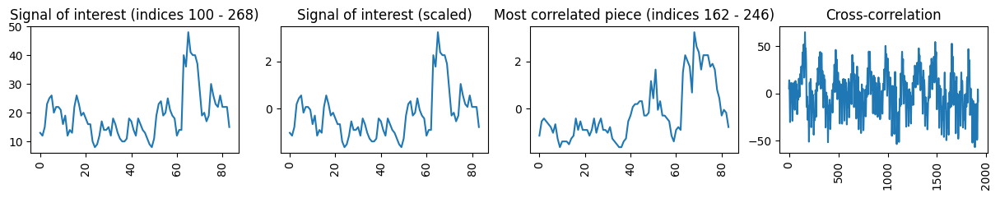

Method 1: Perfect match not found!!
Method 2: Perfect match not found!!


In [14]:
reverse_scaled_matching_piece, locations = cor_correlation(full_signal, signal_of_interest_freq.values, 100, 268)

With frequency changed, the target signal is not found from the full signal.

#### 1.1.4.5 Change waveform structure

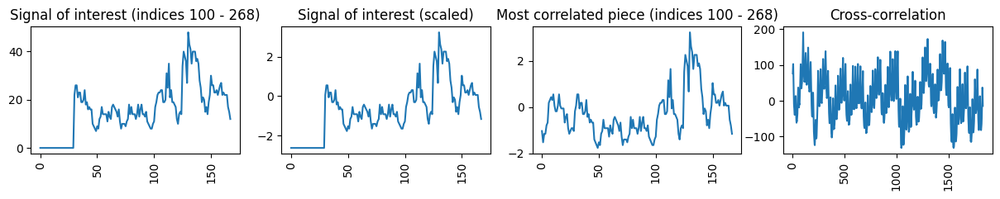

Method 1: Perfect match not found!!
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


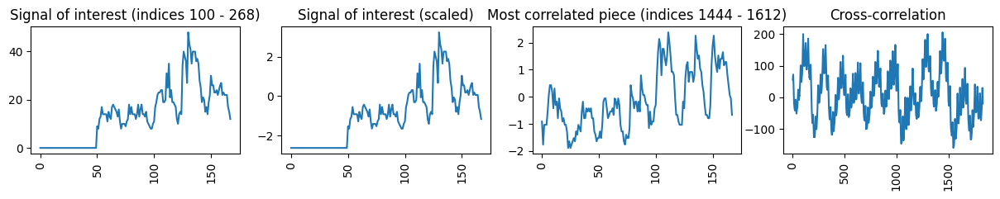

Method 1: Perfect match not found!!
Method 2: Perfect match not found!!


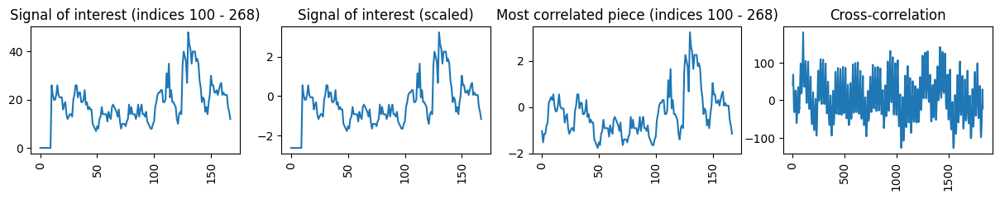

Method 1: Perfect match not found!!
Method 2: Perfect match!! The most correlated piece has the same indices as the signal of interest


In [15]:
# change the waveform structure by replacing a part of the signal amplitude with 0
signal_of_interest_wave = vehicles['Vehicles'][100:268].values.copy()
signal_of_interest_wave[0:30] = 0
_,_ = cor_correlation(full_signal, signal_of_interest_wave, 100, 268)
signal_of_interest_wave[0:50] = 0
_,_ = cor_correlation(full_signal, signal_of_interest_wave, 100, 268)
signal_of_interest_wave = vehicles['Vehicles'][100:268].values.copy()
signal_of_interest_wave[0:10] = 0
signal_of_interest_wave[200:210] = 0
_,_ = cor_correlation(full_signal, signal_of_interest_wave, 100, 268)

When changing only a few short parts of the signal, the cross-correlation still works. However, when changing a longer part of the signal, the cross-correlation does not work anymore.

**Summary: What types of changes are tolerated? Which not?**

-   time shift: Taking another signal piece with same length but shifted time is usually tolerated. This means it still could be found by cross-correlation.
-   signal length changes: Taking longer or slightly shorter signal is tolerated. The signal will still be found. However, when largely reduce the target signal length to a certain level, the signal will not be found from the full signal.
-   amplitude scaling: The signal piece with scaled amplitude could still be found by cross correlation.
-   frequency changes: It is not toleranted, the signal with changed frequency will not be found.
-   Waveform structure changes: When replacing minimal parts of the signal amplitude with 0, usually the signal could still be found. However, when the changes part reach a certain length, the signal could not be recognized from the full signal anymore.




## 1.2 Segmentation, morphological operations, object properties in images
-   Segment objects, save the labeled mask (binary or 1 label per class). 
-   Improve the label mask using morphological operations. 


Show the intermediate results of your applied operations in individual images and that you have only minimally changed the objects (e.g. no shifts, reductions or enlargements). At the end, extract your individual objects, count and measure 2-3 properties of your extracted objects using suitable methods. Explain in 1-2 sentences for each property why you chose it and whether the results are useful.

Then create a minimal but representative skeleton of one of your objects and output the number of pixels of the skeleton.

Discuss your findings and results in approx. 150 words.


### 1.2.1 Segmentation
I will segment the 24 coins in the following selected image, and label the objects with 1 background with 0.

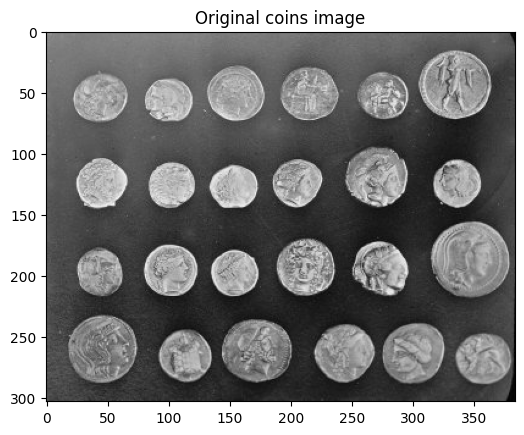

In [16]:
image = cv2.imread('data/coins.png')
fig, ax = plt.subplots()
ax.imshow(image, cmap='gray')
ax.set_title('Original coins image')
plt.show()

The image has background much darker than the coins. So I could apply a threshold to obtain a binary image, where over the threshold is set to white and below is black. 

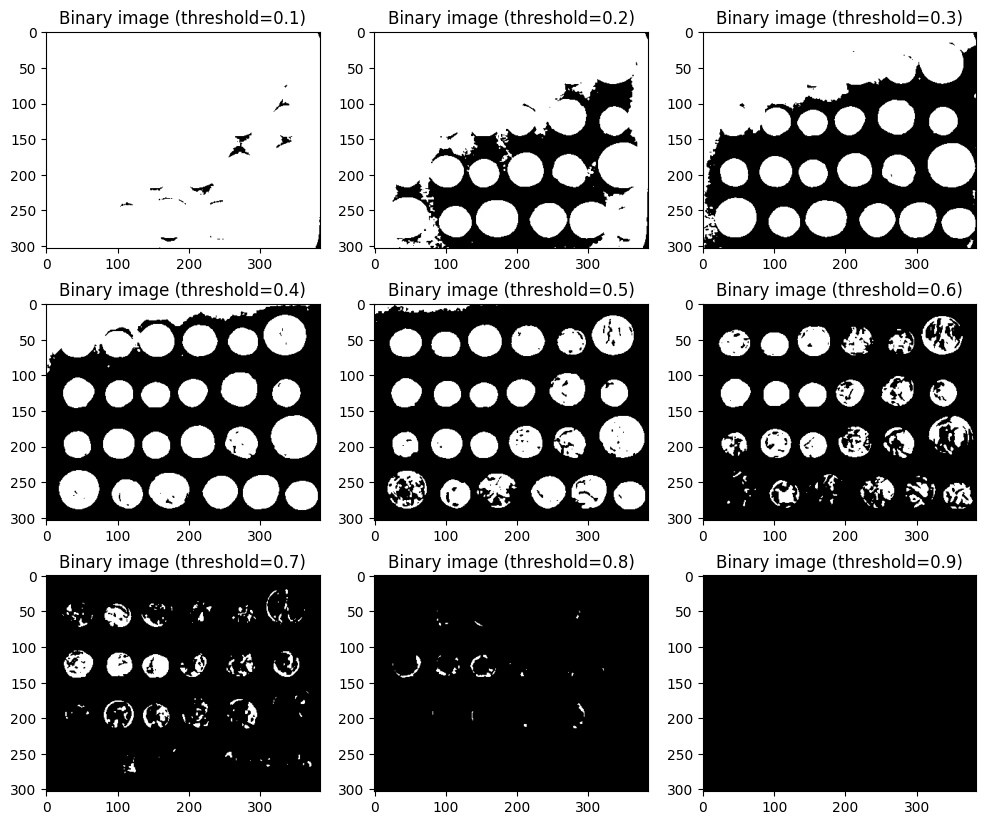

In [17]:
from skimage import io, color, filters, morphology, segmentation
image_gray = color.rgb2gray(image)
# Apply Gaussian blur to reduce noise
blurred_image = filters.gaussian(image_gray, sigma=1)
# Apply thresholding: if pixel value > threshold_value, then set it to 1, otherwise set it to 0
plt.figure(figsize=(12, 10))
for i in range(1, 10):
    threshold_value = i/10
    binary_image = blurred_image > threshold_value
    plt.subplot(3, 3, i)
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary image (threshold={threshold_value})')
plt.show()

Increasing threshold, more pixels will be labeled as black, less as white. With threshold of 0.4, most of the coins could be segmented, except the three coins at the left upper corner, they are connected with the wrong labeled background. With threshold of 0.5, these three coins are not anymore with the noise connected, but quite some coins have too many black pixels at the edges. So I will further fine tune the threshold between 0.4 and 0.5.

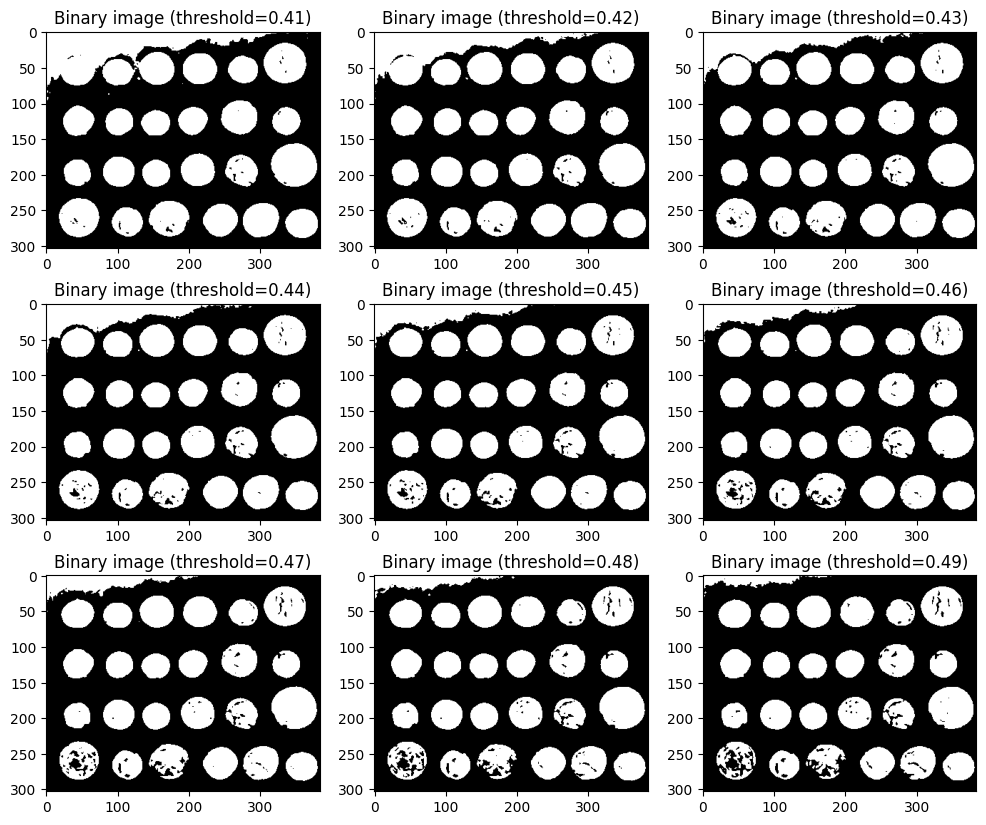

In [18]:
plt.figure(figsize=(12, 10))
for i in range(1, 10): # tune the threshold value between 0.4 and 0.5 to get the best result
    threshold_value = i/100 + 0.4
    binary_image = blurred_image > threshold_value
    plt.subplot(3, 3, i)
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary image (threshold={threshold_value:.2f})')
plt.show()

With threshold of 0.46, the binary image is best balance between segmentation and maintaining most of the coin shapes.

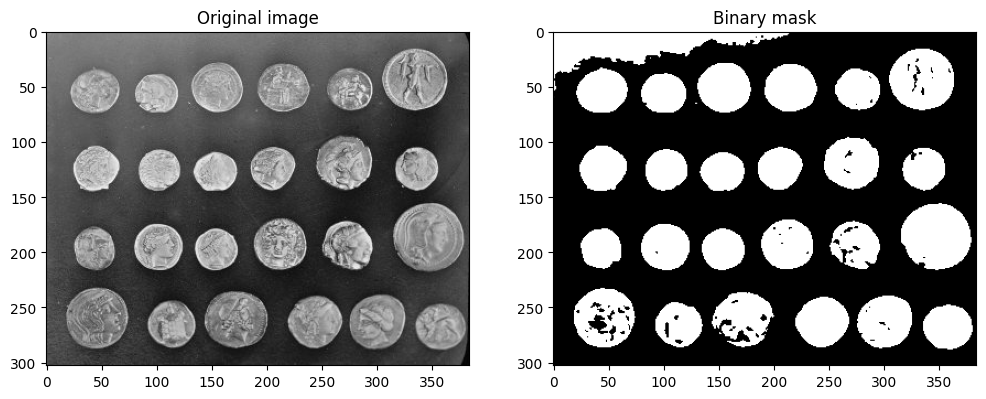

True

In [19]:
binary_image = blurred_image > 0.46
binary_mask = binary_image*1
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original image')
plt.subplot(1, 2, 2)
plt.imshow(binary_mask, cmap='gray')
plt.title('Binary mask')
plt.show()
# save the binary mask
cv2.imwrite('data/coins_binary_mask.png', binary_mask)

Result interpretation:
-  In the binary mask, the background is labeled with 0, the objects are labeled with 1.
-   The mask contains 25 objects (24 coins and 1 piece of noise at the left upper corner). 
-   All objects are not connected to each other.
-   The 24 coin objects have very similar shapes and size to their corresponding original coins in the left image.
-   Some objects have holes inside or at the edge. The boundaries of the objects are not smooth.

### 1.2.2 Improve the label mask by morphology operation

Fill holes by morphology closing operation. 

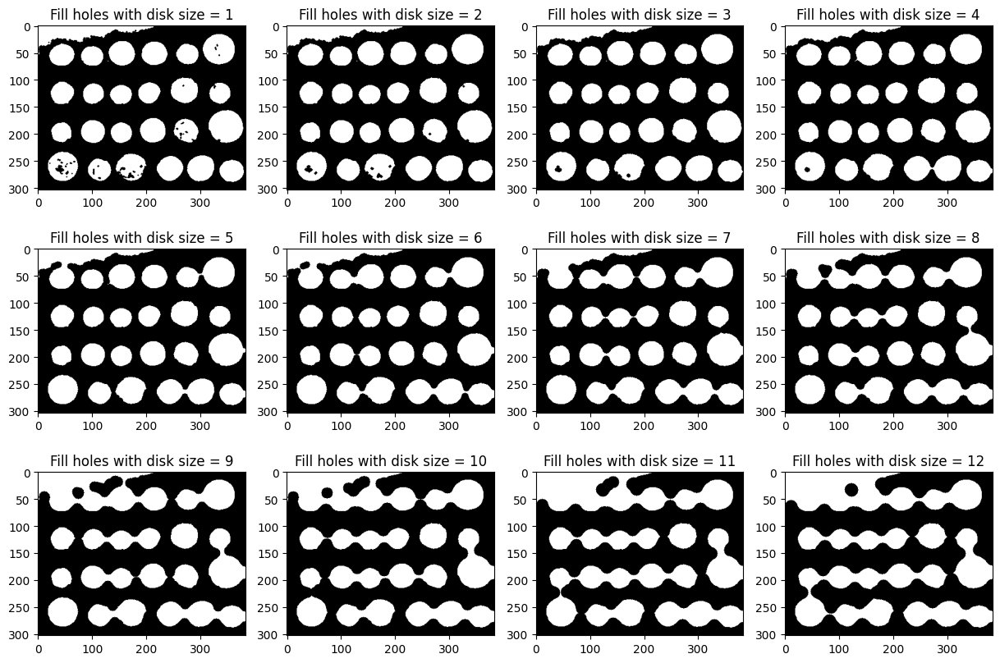

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology, segmentation, measure

# Adjust the disk size as needed to fill larger or smaller holes
morph_close = morphology.binary_closing(binary_mask, morphology.disk(5))
plt.figure(figsize=(15, 10))
for i in range(1, 13):
    morph_close = morphology.binary_closing(binary_mask, morphology.disk(i))
    plt.subplot(3, 4, i)
    plt.imshow(morph_close, cmap='gray')
    plt.title(f'Fill holes with disk size = {i}')

-   With a larger disk size, morphology operation will fill larger holes, however, it will also fill the space between the coins.
-   When disk size of 5, the target holes (inside the coins) are filled, 3 pairs of objects are also connected. 
-   I will select the parameter disk size = 5, because less irrelevant space is filled/connected.
-   Next, I will use morphology open operation to remove the connections between the coins.

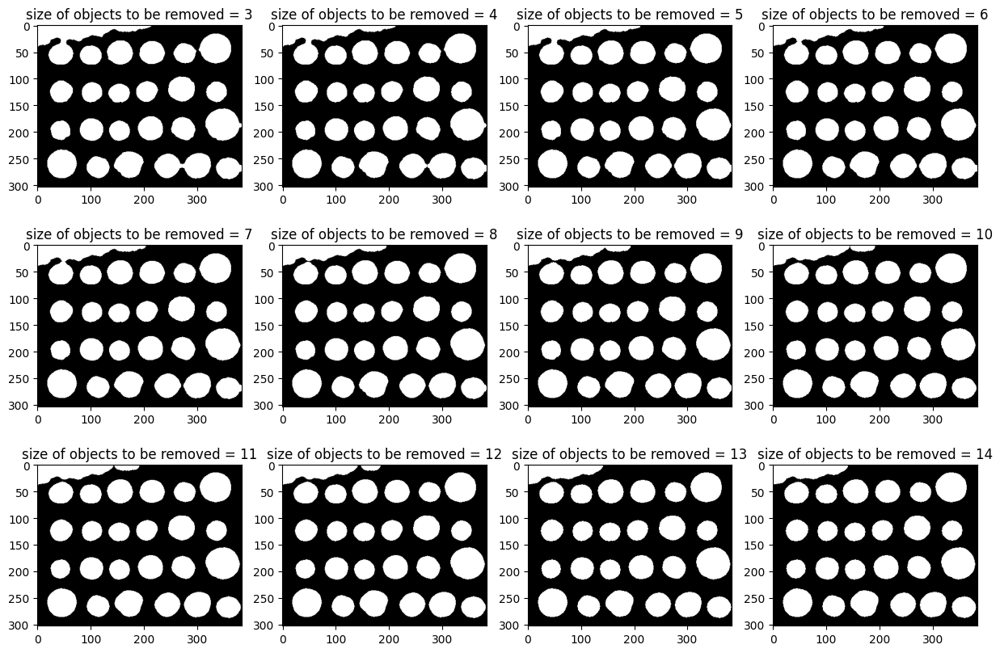

In [21]:
morph_close = morphology.binary_closing(binary_mask, morphology.disk(5))
plt.figure(figsize=(15, 10))
for i in range(1, 13):
    morph_open = morphology.binary_opening(morph_close, morphology.disk(i+2))
    plt.subplot(3, 4, i)
    plt.imshow(morph_open, cmap='gray')
    plt.title(f'size of objects to be removed = {i+2}')

-   Morphology opening operation will remove small objects. My goal is to removed the connections between objects.
-   The operation will remove the small objects with size smaller than the parameter size.
-   When using a larger disk size for opening, more small objects will be removed. 
-   When disk size is too large, the important part of coins or even the coins will be removed as well.
-   With size of 13, the coins have the shape most similar to the original coins.

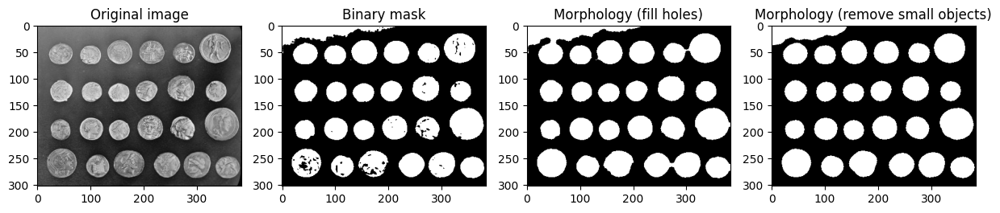

In [22]:
morph_open = morphology.binary_opening(morph_close, morphology.disk(13)) # remove small objects with disk size < 13
image_lst = [image, binary_mask, morph_close, morph_open]
title_lst = ['Original image', 'Binary mask', 'Morphology (fill holes)', 'Morphology (remove small objects)']
plt.figure(figsize=(15, 4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(image_lst[i], cmap='gray')
    plt.title(title_lst[i])

In the upper summary plots, we can see that comparing to the binary mask by pixel value thresholding, the morphology operations can fill the holes in objects and remove the small objects. However, the morphology operations also remove some structures of the coins. 

**Check the quality of segmentation**

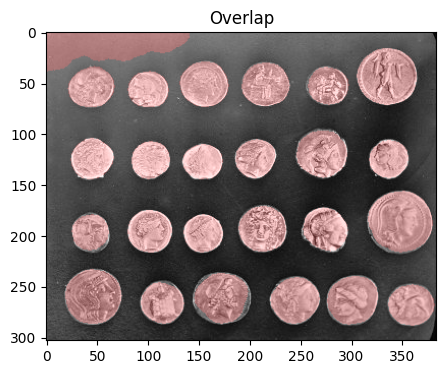

In [23]:
# Check the quality of the final binary mask
white_areas = morph_open > 0
red_overlay = np.zeros_like(image)
red_overlay[white_areas] = [255, 0, 0]

overlay = cv2.addWeighted(image, 1, red_overlay, 0.2, 0.0) 
plt.figure(figsize=(15, 4))
plt.imshow(overlay)
plt.title('Overlap')
plt.show()


With overlapping the original image and the binary mask, we can see that some objects in binary mask have small edges missing. However, the binary mask is good enough for the purpose of segmentation. The left upper noise object will be removed in the next part.

### 1.2.3 Object properties
Extract individual objects, count, and remove the non-coin object.

Total number of objects: 25


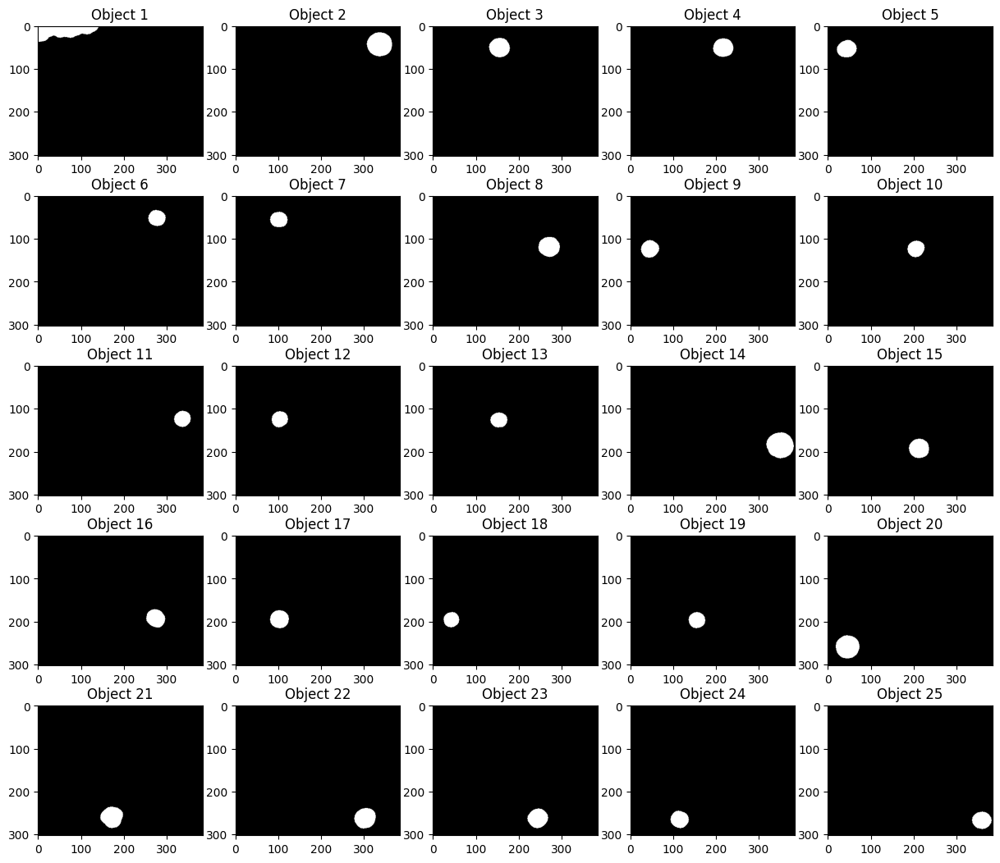

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, morphology, segmentation, measure

# Label connected components (objects) in the binary mask
label_image, num_labels = morphology.label(morph_open, connectivity=2, return_num=True)
print(f"Total number of objects: {num_labels}")
region_props = measure.regionprops(label_image) # measure properties of labeled image regions
individual_object_masks = []

# Extract individual objects and plot them
plt.figure(figsize=(15, 13))
i = 0
for region in region_props:
    object_mask = np.zeros_like(binary_mask)
    object_mask[label_image == region.label] = 1
    individual_object_masks.append(object_mask)
    plt.subplot(5, 5, i+1)
    plt.title(f"Object {i+1}")
    plt.imshow(object_mask, cmap='gray')
    i += 1


25 objects are extracted from the binary mask. The non-coin object has index of 0. Remove it.

Total number of objects: 24


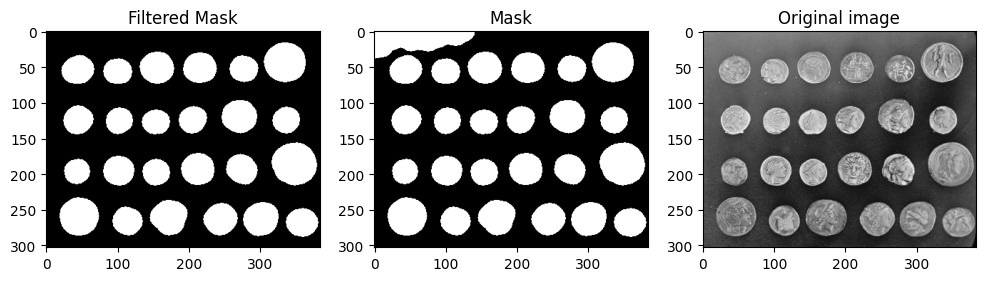

In [25]:
new_binary_mask = np.zeros_like(morph_open, dtype=np.uint8)
new_individual_object_masks = individual_object_masks[1:]
# Combine the individual object masks into a single mask using logical OR
for object_mask in individual_object_masks[1:]:
    new_binary_mask = np.logical_or(new_binary_mask, object_mask)
new_binary_mask = new_binary_mask*1
# save the image
cv2.imwrite('data/filtered_binary_mask.png', new_binary_mask)
# count the number of objects
label_image, num_labels = morphology.label(new_binary_mask, connectivity=2, return_num=True)
print(f"Total number of objects: {num_labels}")

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 2)
plt.imshow(morph_open, cmap='gray')
plt.title('Mask')
plt.subplot(1, 3, 1)
plt.imshow(new_binary_mask, cmap='gray')
plt.title('Filtered Mask')
plt.subplot(1, 3, 3)
plt.imshow(image, cmap='gray')
plt.title('Original image')
plt.show()

After removing the non-coin object, the mask contains 24 coin objects, same as in original image.

**Measure 2-3 properties of the extracted objects** 

-   area: in pixels. Area of an object is useful to distinguish between small and large objects, which is often used in object classification or counting.
-   perimeter: length of the object boundary (in pixels). It is helpful for distinguishing objects with similar areas but different shapes, for example, identifying objects with irregular or complex boundaries.
-   short axis / long axis: the length of the shortest/longest line that can be drawn through the object (in pixels). They are useful for characterizing the shape and orientation of objects, for instance, distinguishing between round and non-round objects.

-   skeleton: I use the contour of the object to represent the object (in pixels). Skeleton is helpful to distinguish objects with similar shapes but different internal structures.

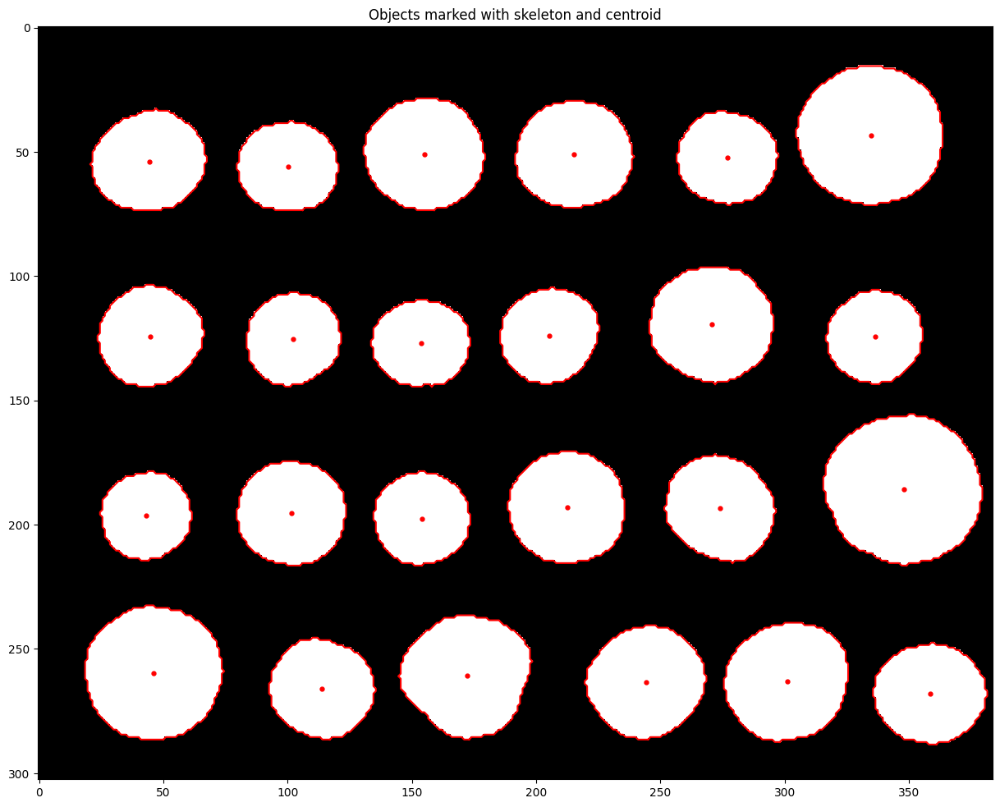

In [26]:
from skimage import measure, io
import matplotlib.pyplot as plt

label_image = measure.label(new_binary_mask, connectivity=2)

# Calculate properties of labeled regions (individual objects)
region_props = measure.regionprops(label_image)

object_properties = pd.DataFrame(columns=['area', 'perimeter', 'skeleton_len', 'short axis', 'long axis'])

# Measure properties of individual objects
plt.figure(figsize=(15, 22))
for i, region in enumerate(region_props):
    area_pixels = region.area
    perimeter_pixels = region.perimeter 
    centroid_pixels = region.centroid
    short_axis_pixels = region.minor_axis_length
    long_axis_pixels = region.major_axis_length

    contours = measure.find_contours(new_individual_object_masks[i], 0.5)
    contour_length_pixels = sum(len(contour) for contour in contours)
    
    object_properties.loc[i] = {'area': area_pixels, 'perimeter': perimeter_pixels, 'short axis': short_axis_pixels, 'long axis': long_axis_pixels, 'skeleton_len': contour_length_pixels}

    plt.imshow(new_binary_mask, cmap='gray')
    for contour in contours:
        plt.plot(contour[:, 1], contour[:, 0], linewidth=1.5, c='red')
    plt.scatter(centroid_pixels[1], centroid_pixels[0], c='red', marker='.', s=50)
    plt.title('Objects marked with skeleton and centroid')
plt.show()
   

In [27]:
object_properties

,area,perimeter,skeleton_len,short axis,long axis
0,2585.0,188.509668,231,55.896587,58.905248
1,1703.0,152.367532,189,45.020576,48.187958
2,1608.0,148.710678,183,43.262187,47.362569
3,1442.0,140.953319,177,39.774517,46.201632
4,1179.0,127.639610,159,37.170651,40.424966
5,1159.0,125.982756,155,36.152835,40.859479
6,1818.0,157.781746,195,46.340453,49.984636
7,1318.0,134.124892,169,39.766448,42.250606
8,1181.0,127.053824,159,37.224601,40.439646
9,1125.0,123.639610,155,36.836216,38.907145


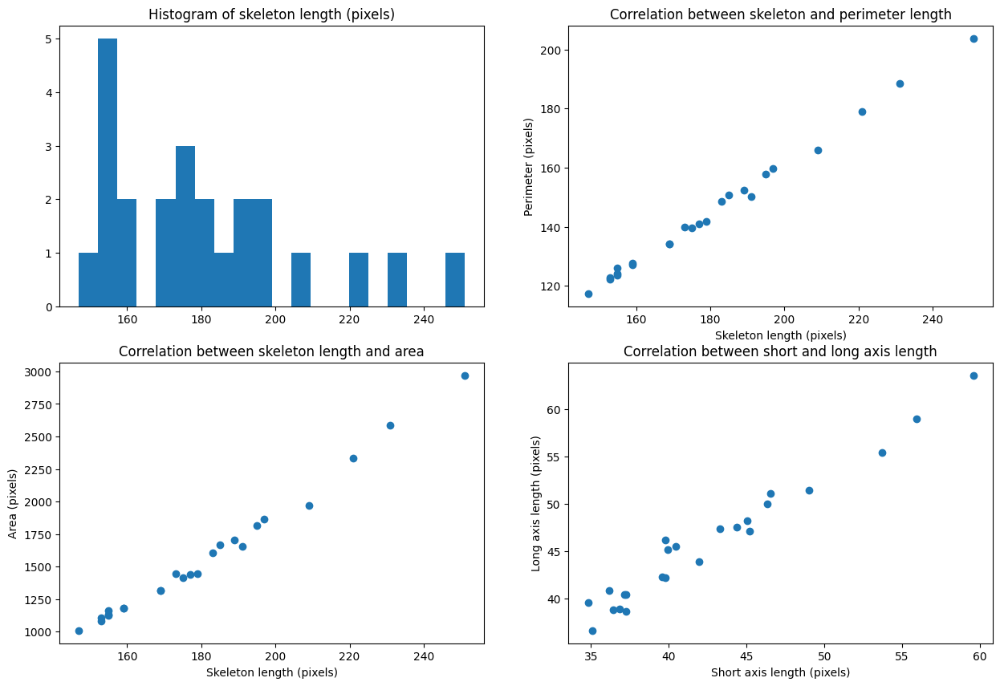

In [28]:

# plot the histogram of skeleton length
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.hist(object_properties['skeleton_len'], bins=20)
plt.title('Histogram of skeleton length (pixels)')
# correlation between skeleton length and area

plt.subplot(2, 2, 2)
plt.scatter(object_properties['skeleton_len'], object_properties['perimeter'])
plt.xlabel('Skeleton length (pixels)')
plt.ylabel('Perimeter (pixels)')
plt.title('Correlation between skeleton and perimeter length')

plt.subplot(2, 2, 3)
plt.scatter(object_properties['skeleton_len'], object_properties['area'])
plt.ylabel('Area (pixels)')
plt.xlabel('Skeleton length (pixels)')
plt.title('Correlation between skeleton length and area')

plt.subplot(2, 2, 4)
plt.scatter(object_properties['short axis'], object_properties['long axis'])
plt.xlabel('Short axis length (pixels)')
plt.ylabel('Long axis length (pixels)')
plt.title('Correlation between short and long axis length')

plt.show()


All five properties are positive correlated with each other.

-   The histogram of skeleton length is right skewed, with most of the objects having skeleton length between 145 and 200 pixels, only four objects larger than 200 pixels. This is consistent with the original image, where most of the objects are small coins, only four coins are significantly large.
-   skeleton length and perimeter: the correlation is linear, they discribe similar information, but skeleton should be one pixel circle larger than perimeter. The difference between the two should be around a constant.
-   skeleton length and area: The two properties are positive correlated, the correlation is not linear, but rather exponential. 
-   short axis and long axis: the correlation is positive and linear. A smaller difference between the two axes indicates the object is more circular. 

The properties together can be used to describe the shape of the objects.

# 2 Feature descriptors in images 
## 2.1 Keypoint matching

-   Discuss in about 150 words how robust the algorithm {'ORB'} assigned to you is in relation to transformations or different recording conditions (light, ...) and its computational efficiency. Show at least one of these properties using your sample data. Discuss the results and findings in 2-3 sentences.

Attention: this is an open task. Set a limit for yourself or come to the consultation if the boundaries are not clear to you. Appropriate data selection, to-the-point creativity, moderate diversity and critical thinking are sought after.

### 2.1.1 Find images with same object from different angles/perspective/distance/rotation

I select the horse-1 images with eight different viewpoints from ETH-80 dataset. 

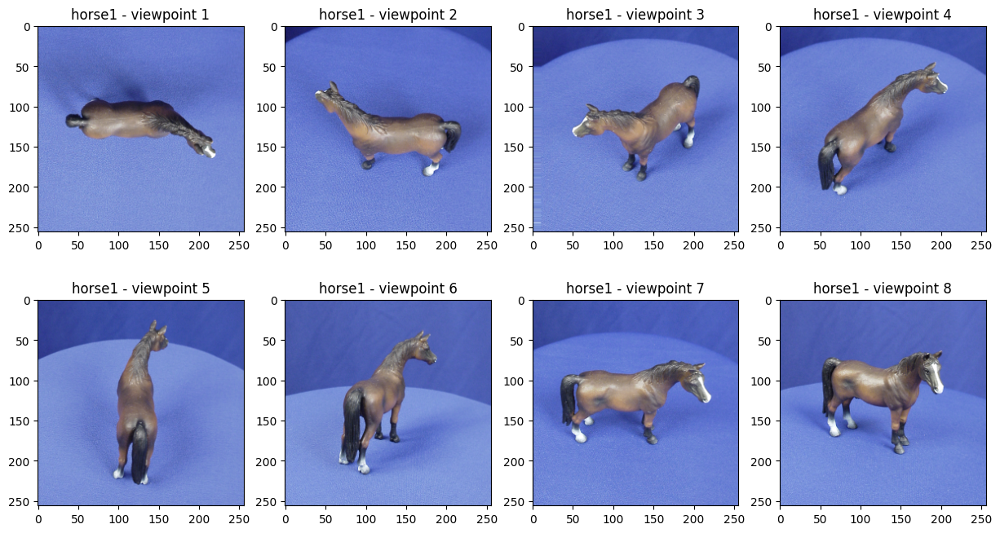

In [29]:
horse1_lst = []
plt.figure(figsize=(15, 8))
for i in range(0, 8):
    # import image and convert from gbr to rgb
    horse_image = io.imread(f'data/horse1_{i+1}.png')
    # append the gray image to the list
    horse1_lst.append(cv2.cvtColor(horse_image, cv2.COLOR_RGB2GRAY))
    plt.subplot(2, 4, i+1)
    plt.imshow(horse_image)
    plt.title(f"horse1 - viewpoint {i+1}")
plt.show()

### 2.1.2 Use the ORB keypoint descriptor to match two images via keypoints

Choose suitable ORB Parameters:

-   nFeatures: The maximum number of keypoints to retain. It can control how many keypoints will be detected.
-   scaleFactor: This parameter is helpful in pyramid scaling. 
-   nLevels: The number of pyramid levels in the image. Increasing this can make ORB detect keypoints at more scales.
-   edgeThreshold: The size of the border where the features are not detected. Increasing this can limit the keypoints to regions away from image borders.

I will tune a series values of nfeatures to find out the suitable number of keypoints for my selected images. 

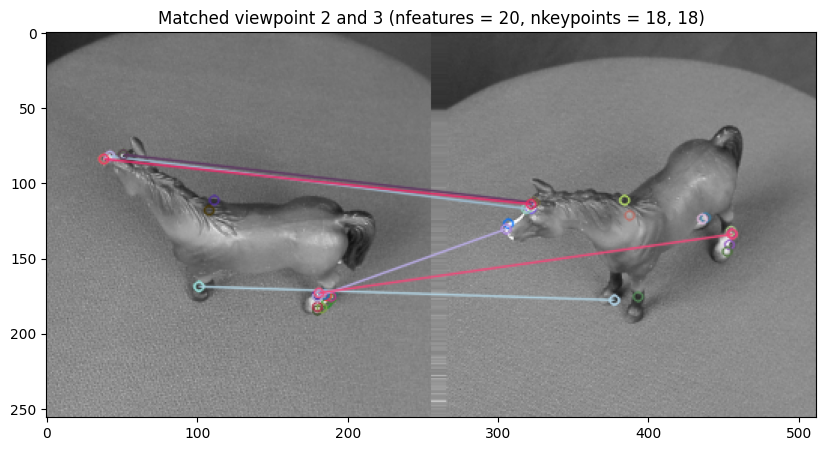

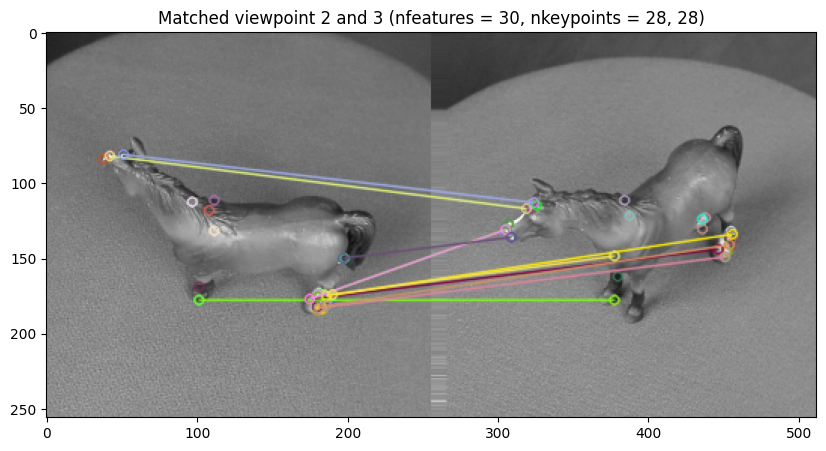

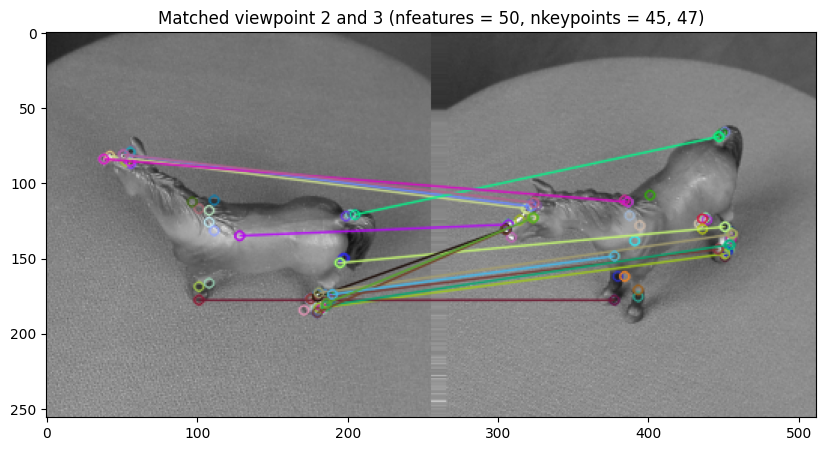

In [34]:
def orb_match_2_images(image1, image2, nfeatures, scalefactor, nlevels, edgethreshold, extra_title = ''):
    orb = cv2.ORB_create(nfeatures=nfeatures, scaleFactor=scalefactor, nlevels=nlevels, edgeThreshold=edgethreshold)
    # Find keypoints and descriptors
    keypoints1, descriptors1 = orb.detectAndCompute(image1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(image2, None)
    # Initialize BFMatcher (Brute-Force Matcher) with default params
    # crossCheck=True means that the BFMatcher will only return consistent pairs
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    # Match descriptors
    matches = bf.match(descriptors1, descriptors2)
    # Sort them in ascending order of distance
    matches = sorted(matches, key=lambda x: x.distance)
    # Draw the first 10 matches
    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[:20], outImg=None)
    plt.figure(figsize=(12, 5))
    plt.imshow(matched_image)
    plt.title(f"Matched viewpoint {index_1+1} and {index_2+1} ({extra_title}, nkeypoints = {len(keypoints1)}, {len(keypoints2)})")
    plt.show()

index_1, index_2 = 1, 2
image1 = horse1_lst[index_1]
image2 = horse1_lst[index_2]
for nfeatures in [20, 30, 50]:
    orb_match_2_images(image1, image2, nfeatures, 1.5, 5, 31, f'nfeatures = {nfeatures}')
    

With larger nfeatures, more keypoints are detected. However, more keypoints does not mean better matching. 
For example, in the case of nfeatures = 100, many keypoints detected in viewpoint 2 and 3 are not consistent. 
This is because the pixels in the two images are very similar, and ORB detect keypoints based on the intensity of the pixels. 


I will choose nfeatures = 30 for the following analysis, because it gives a good balance between the number of keypoints and the quality of matching.

Now I will tune other three parameters.

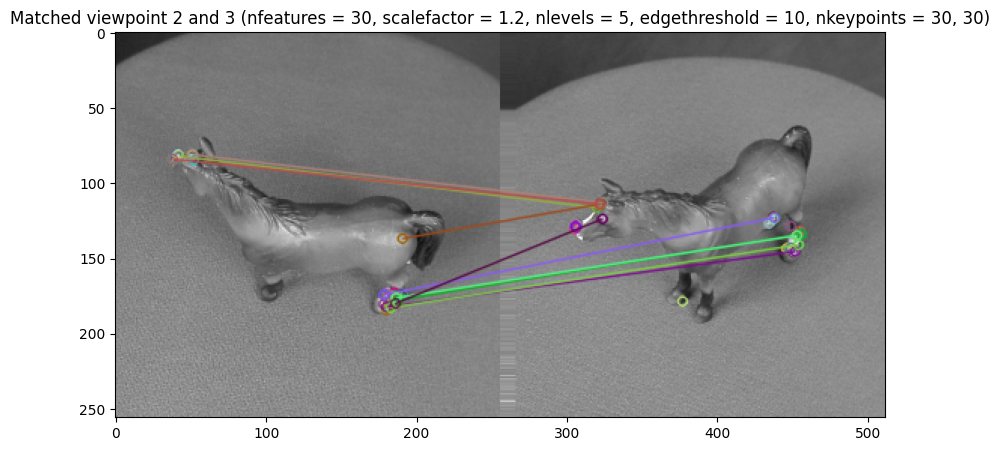

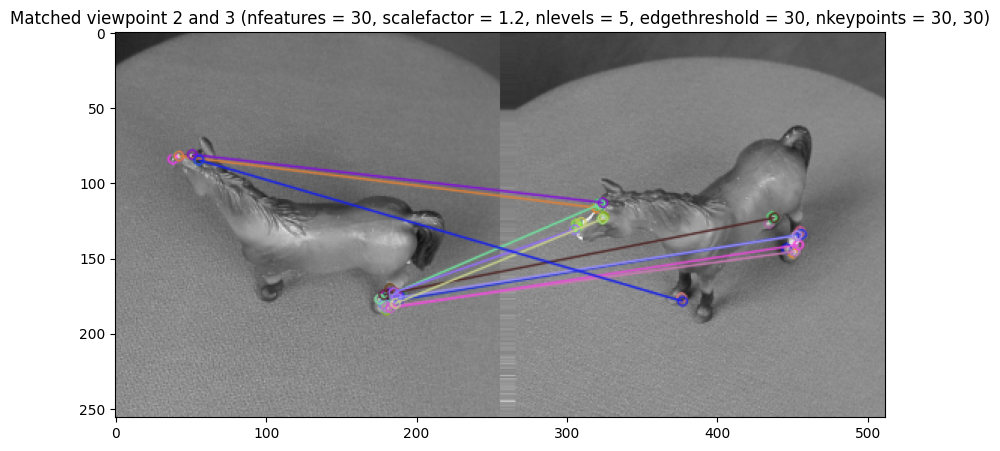

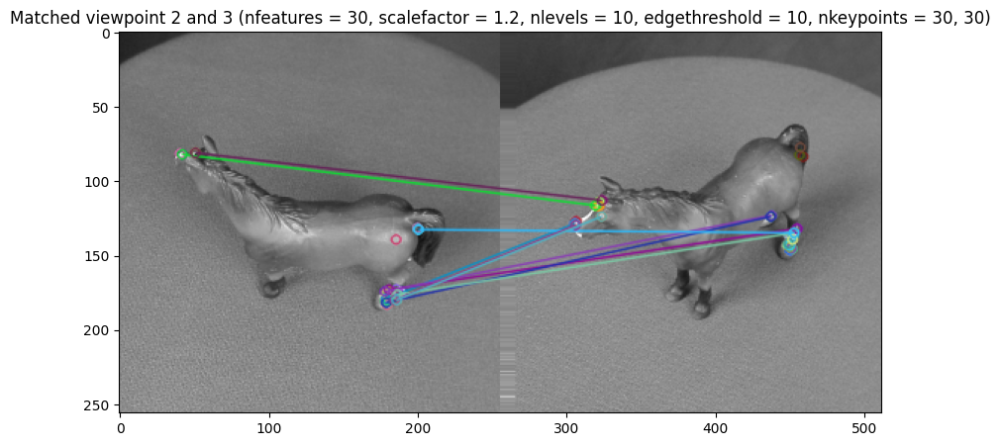

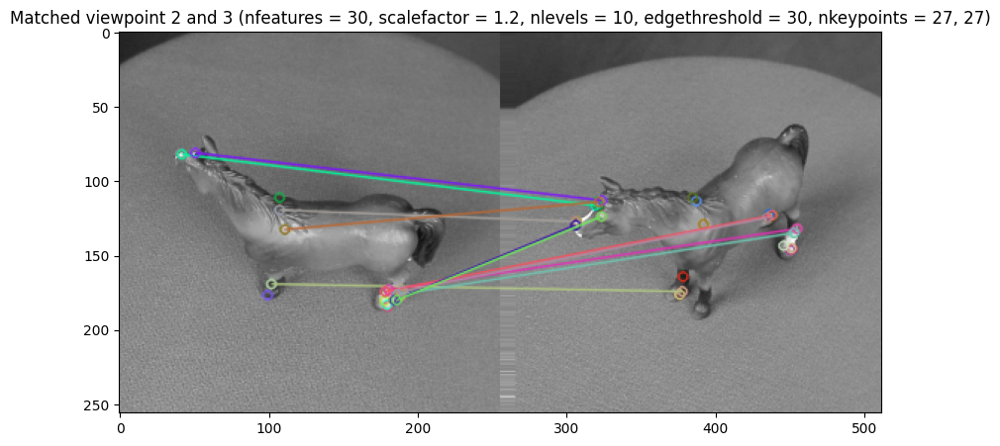

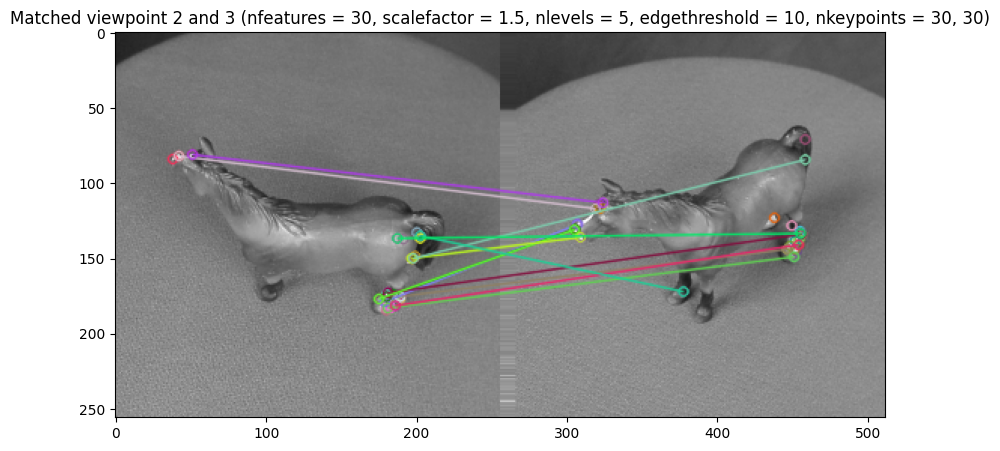

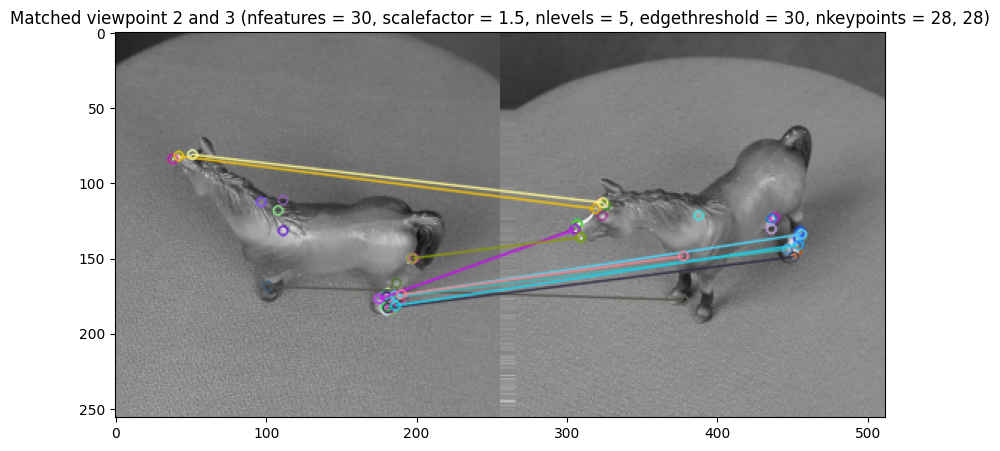

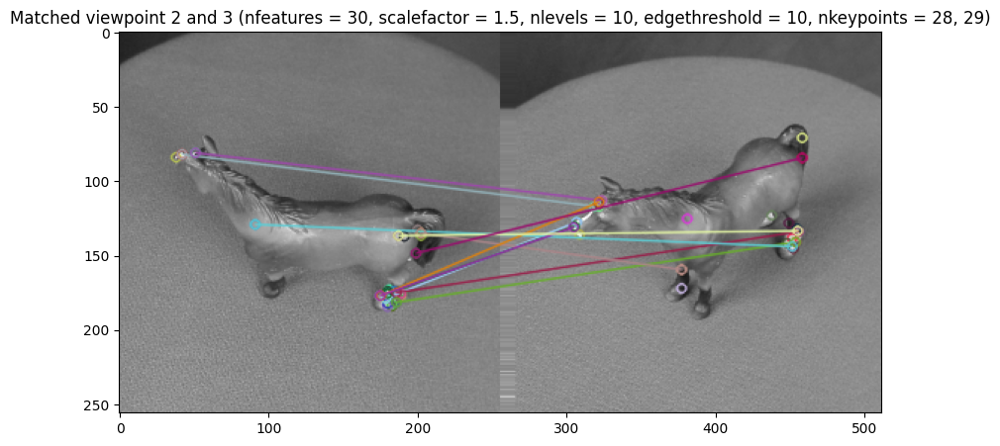

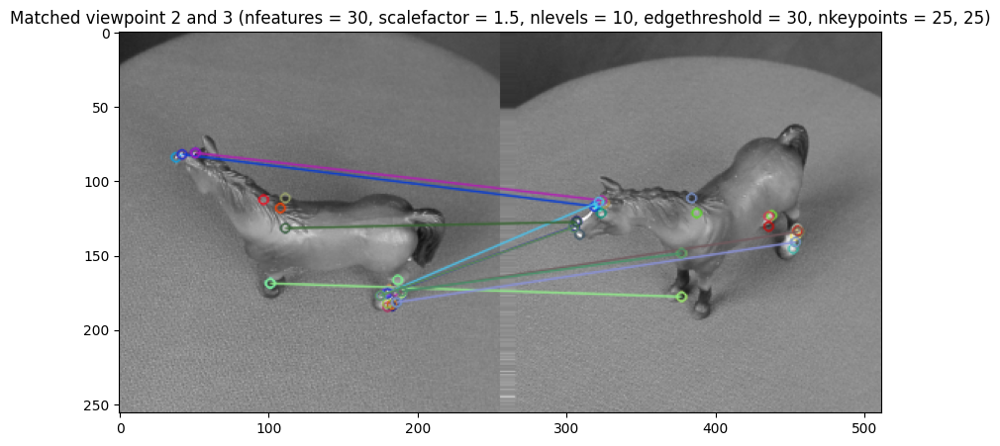

In [40]:
for scalefactor in [1.2, 1.5]:
        for nlevels in [5, 10]:
            for edgethreshold in [10,30]:
                orb_match_2_images(image1, image2, 30, scalefactor, nlevels, edgethreshold, f'nfeatures = 30, scalefactor = {scalefactor}, nlevels = {nlevels}, edgethreshold = {edgethreshold}')


with nfeatures = 30, scalefactor = 1.5, nlevels = 5, edgethreshold = 30, we get the best result (6 correct matches). 

Now I will try to match all the possibilities of the eight image to find out when could two images be matched and when not.

<Figure size 1200x800 with 0 Axes>

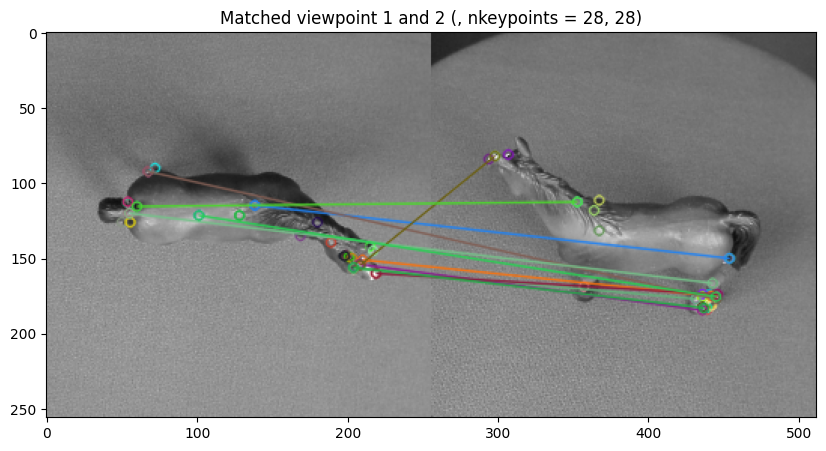

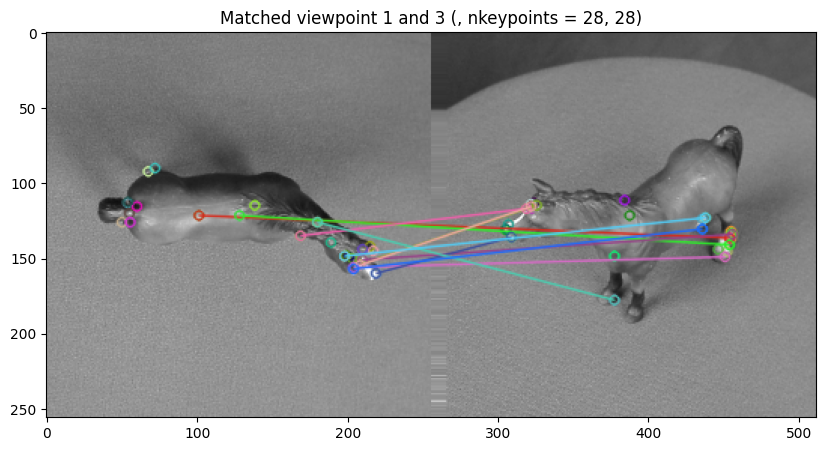

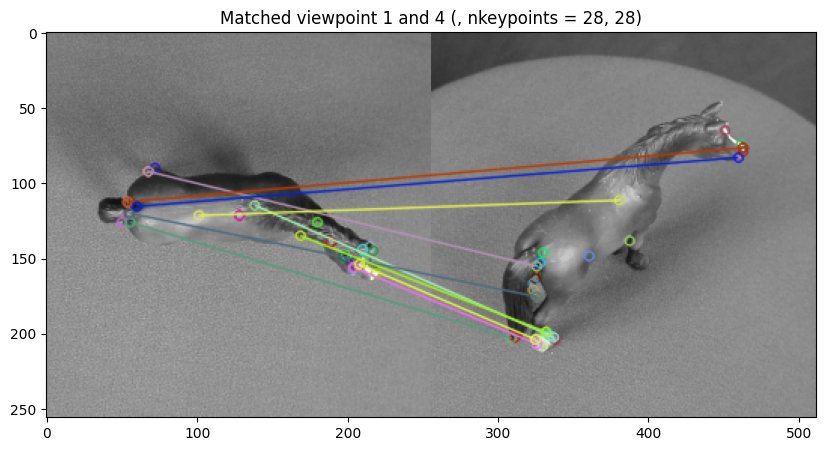

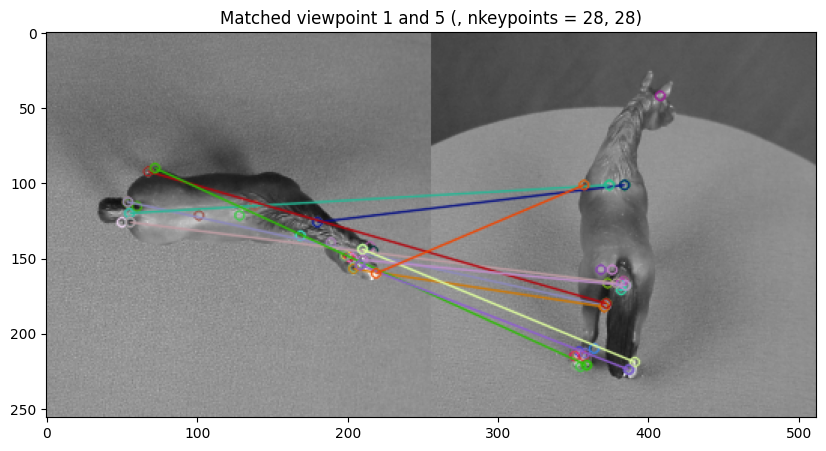

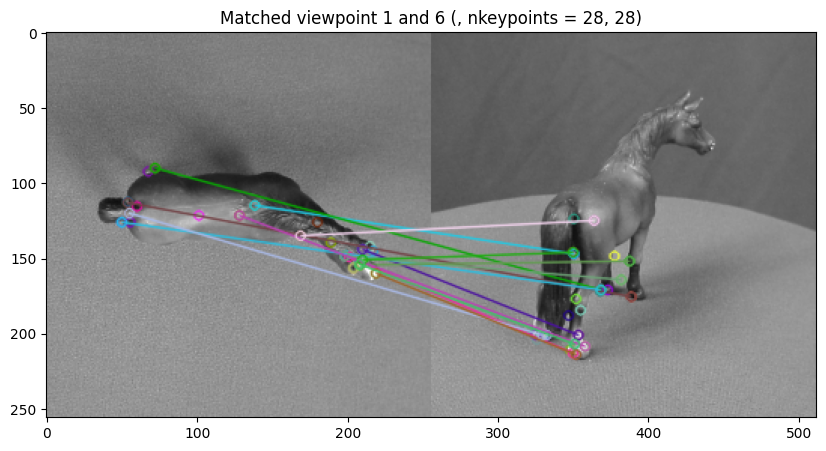

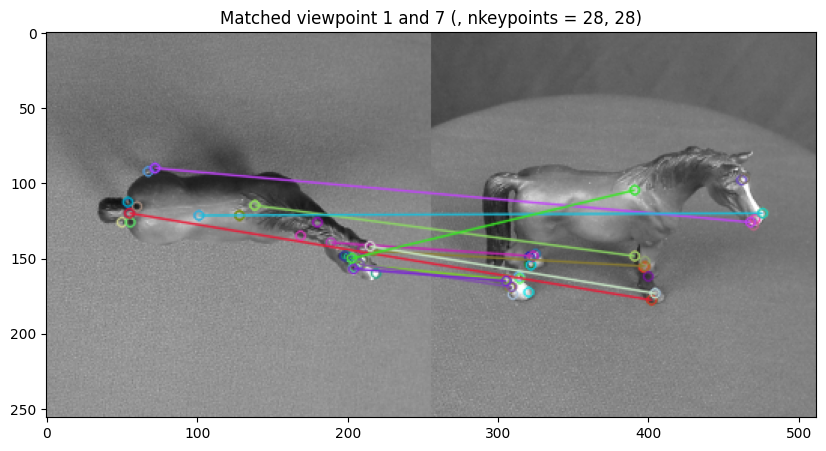

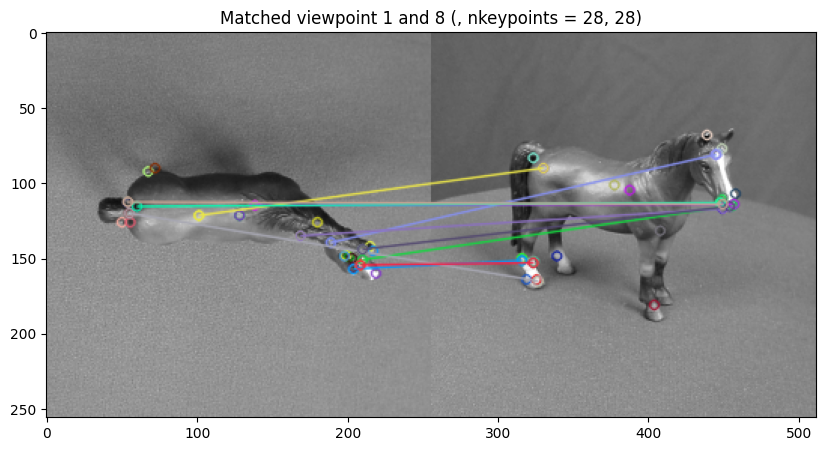

<Figure size 1200x800 with 0 Axes>

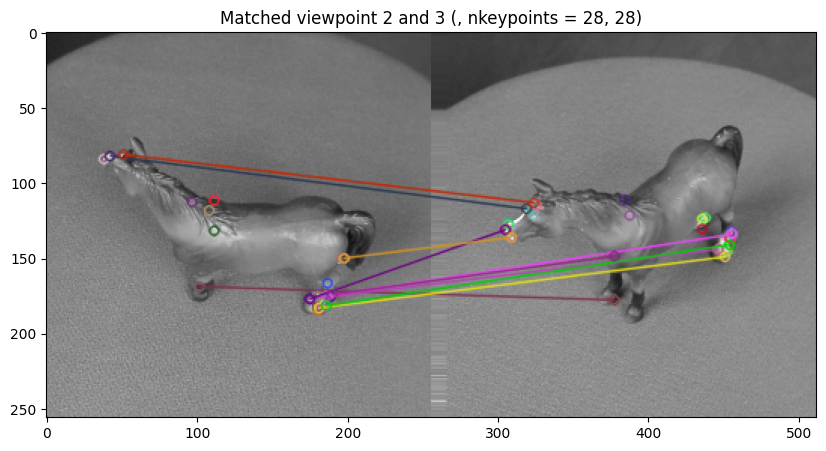

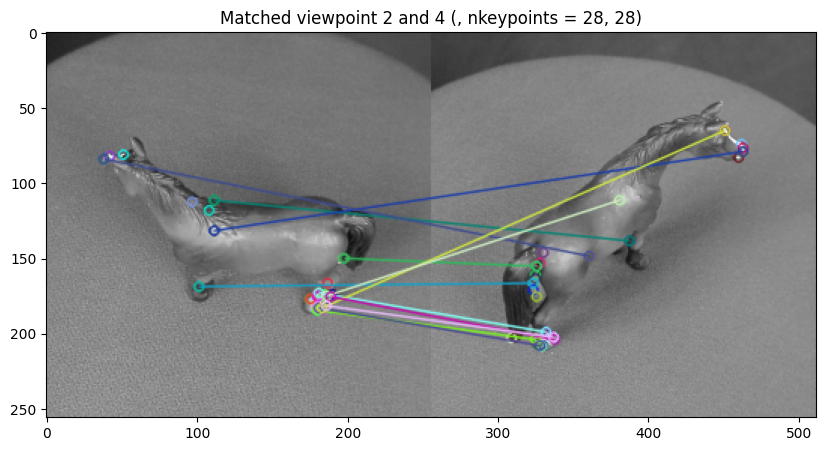

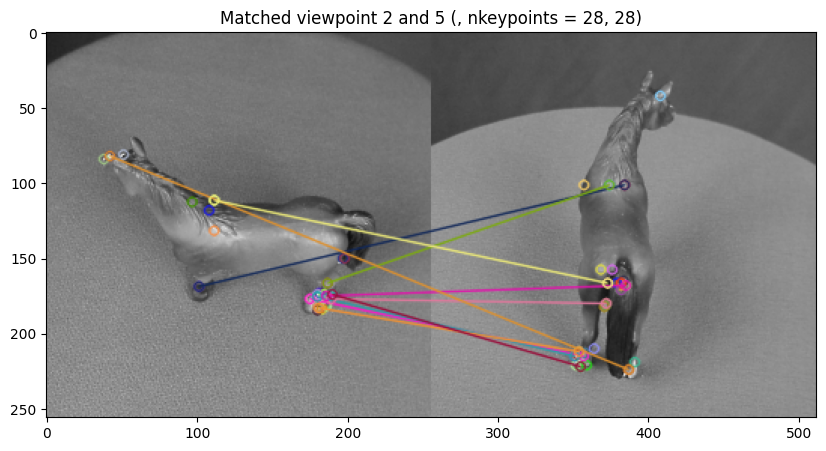

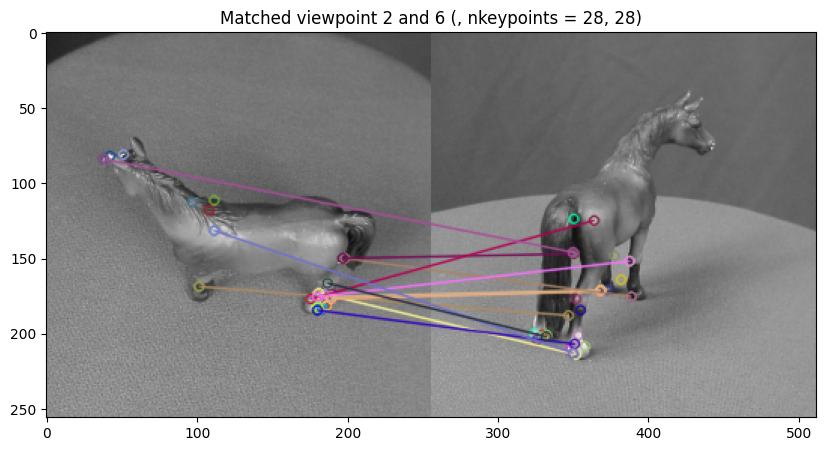

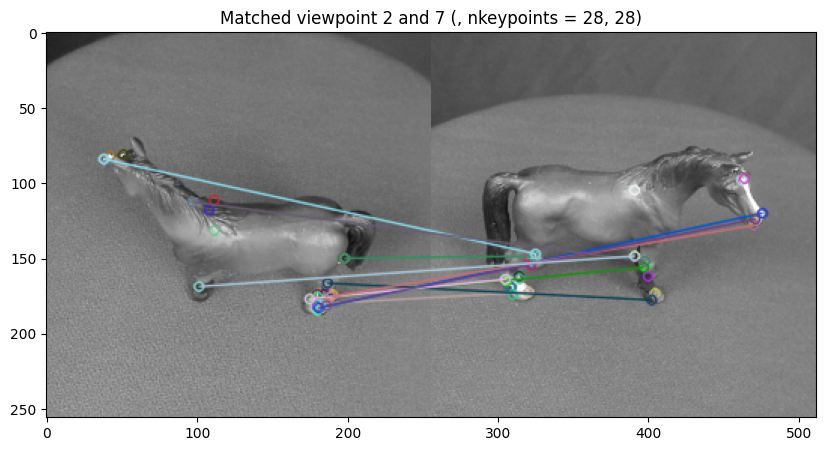

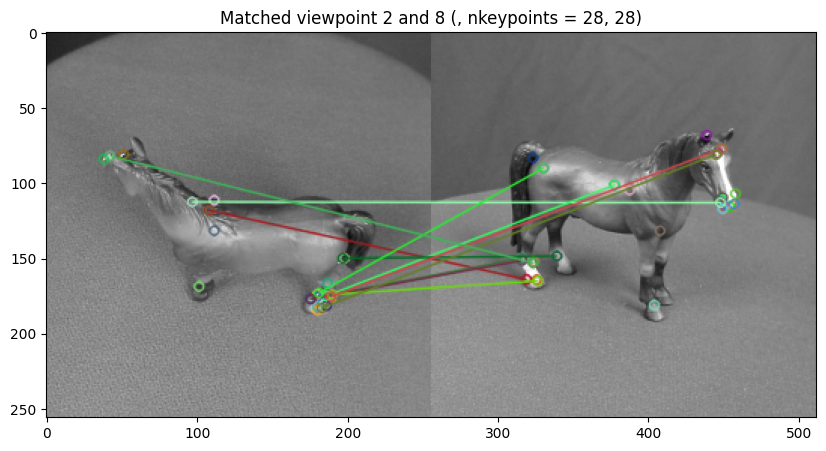

<Figure size 1200x800 with 0 Axes>

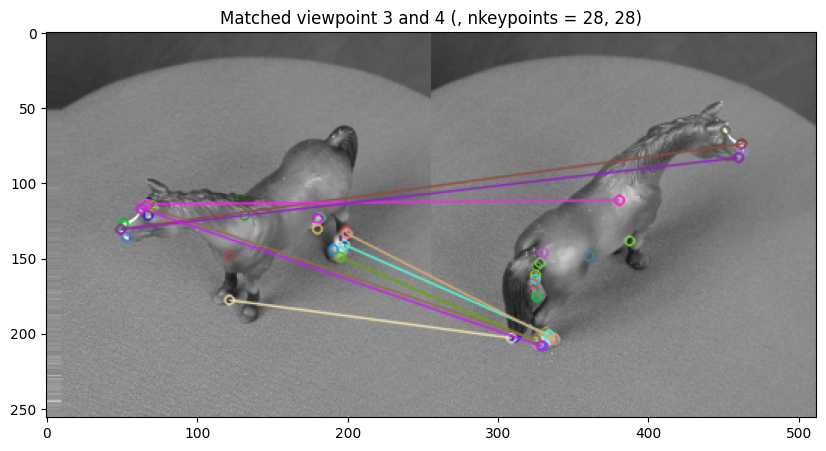

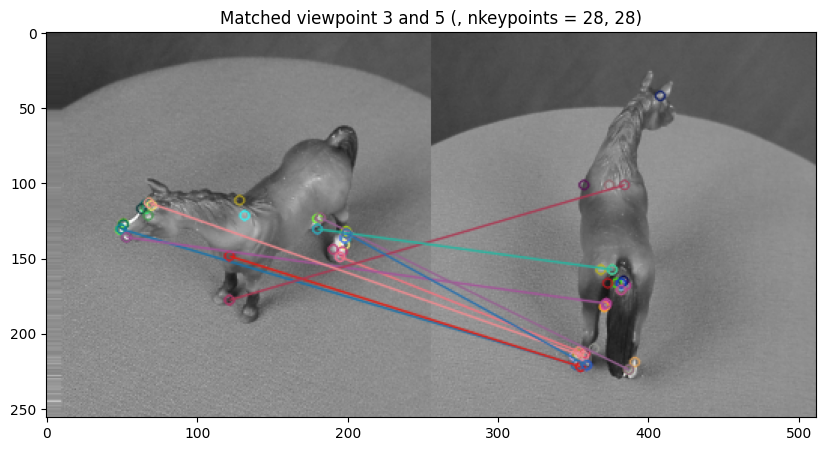

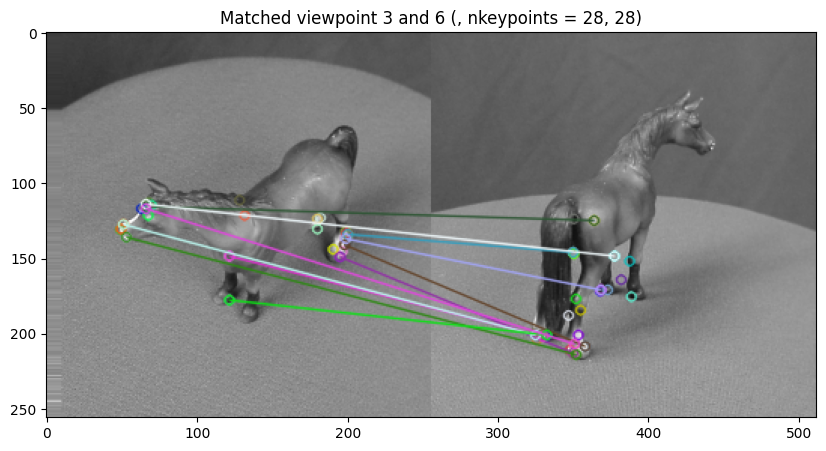

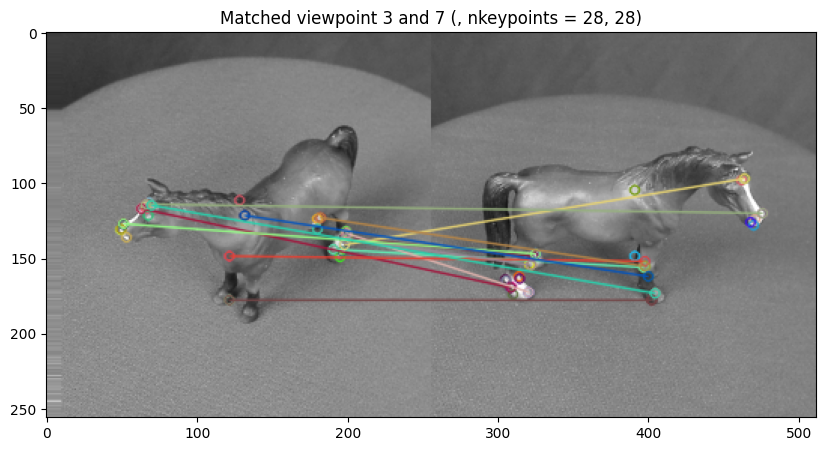

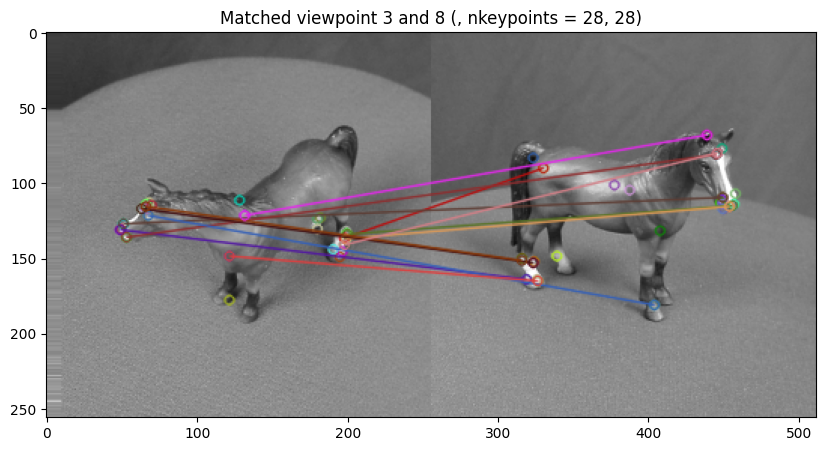

<Figure size 1200x800 with 0 Axes>

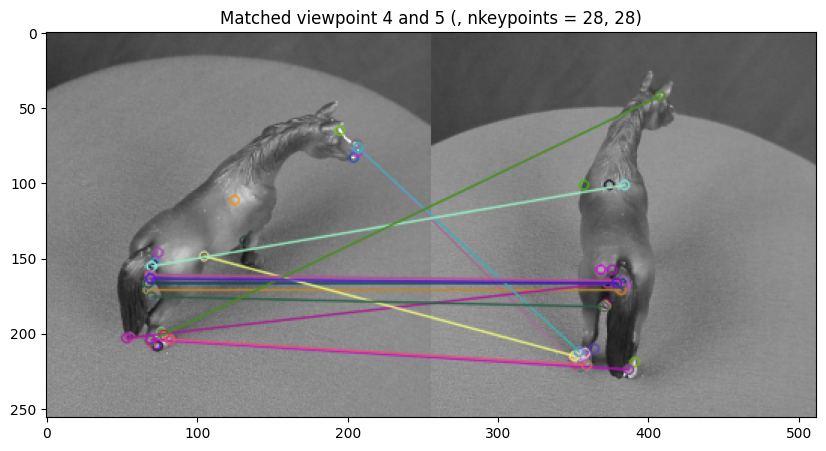

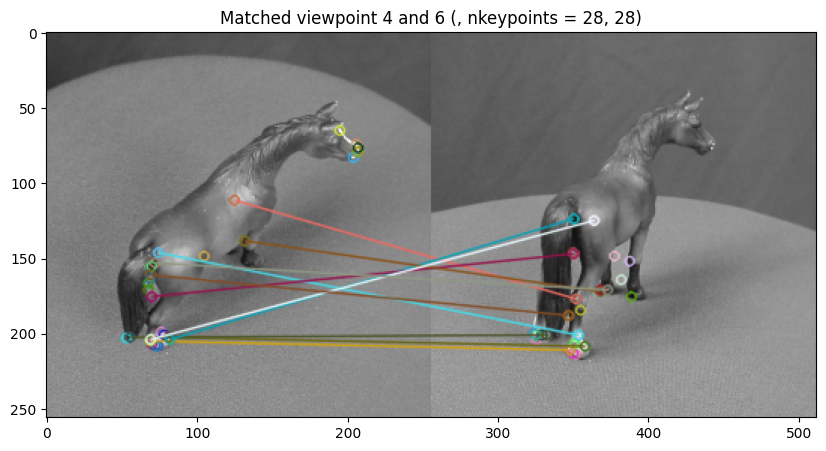

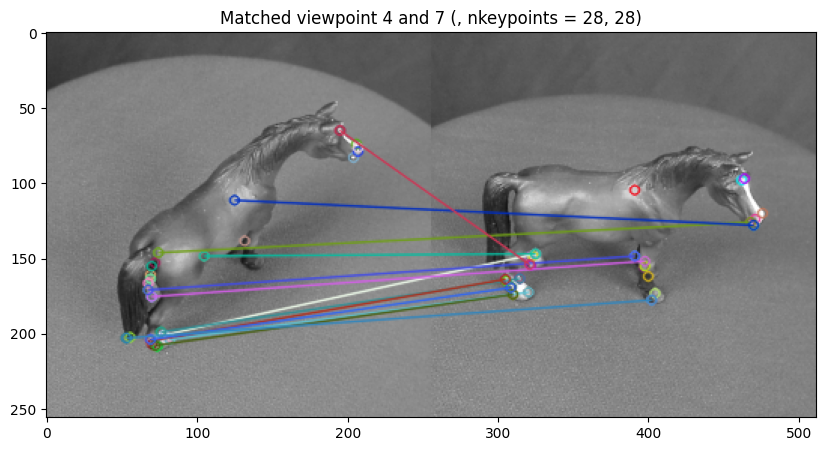

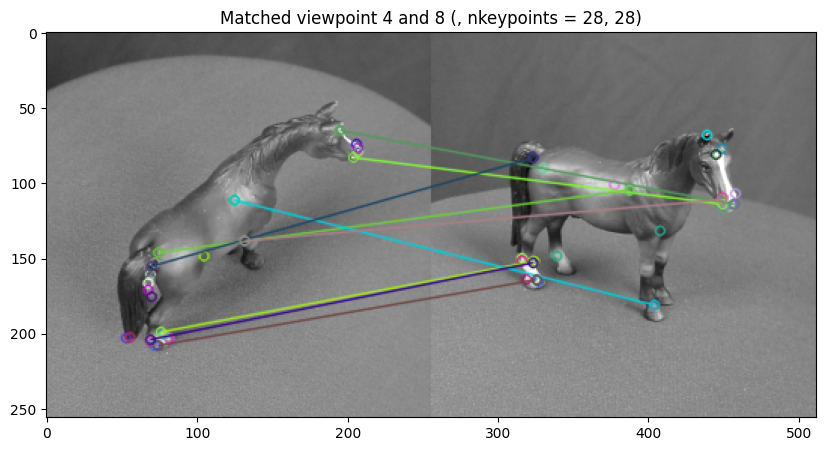

<Figure size 1200x800 with 0 Axes>

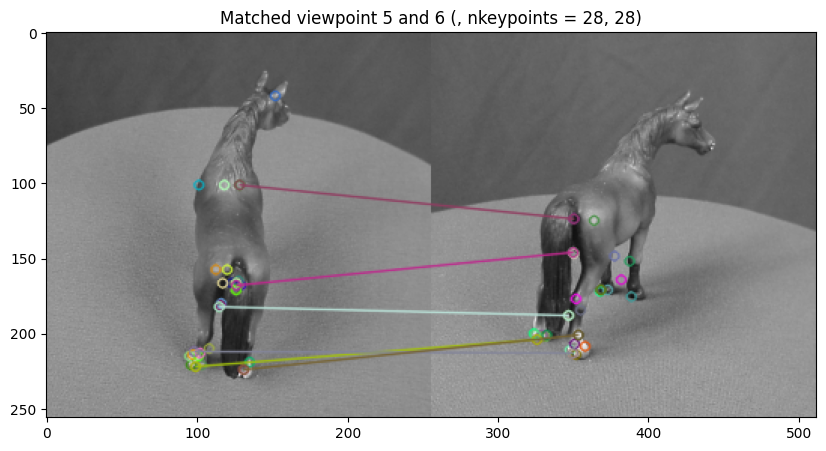

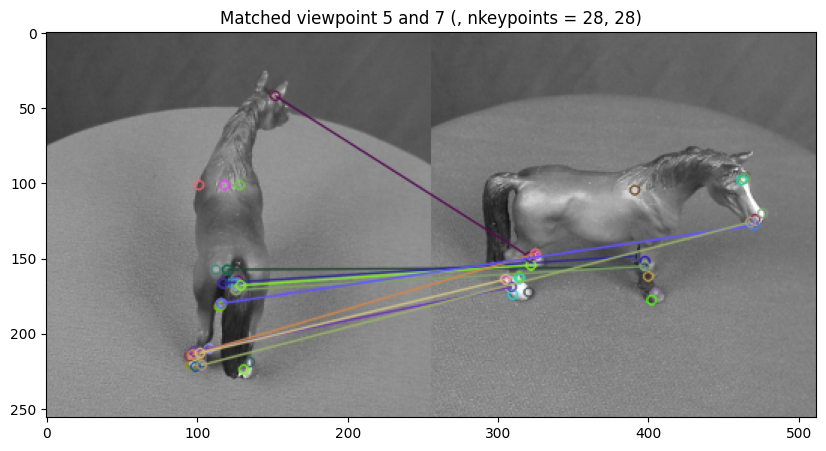

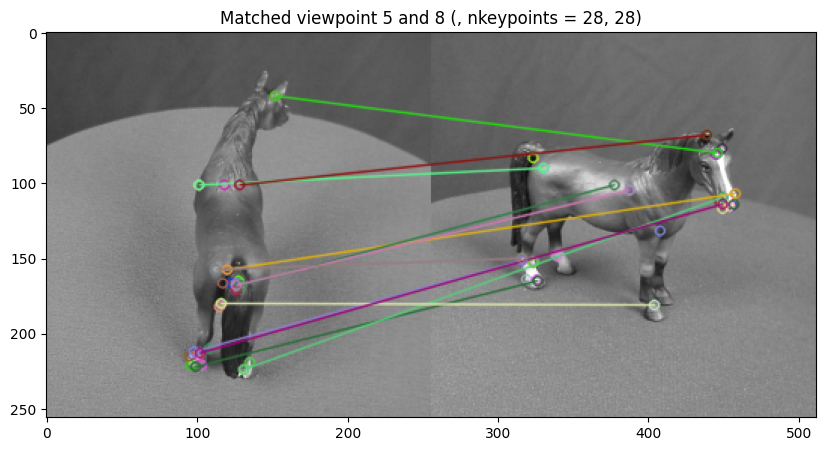

<Figure size 1200x800 with 0 Axes>

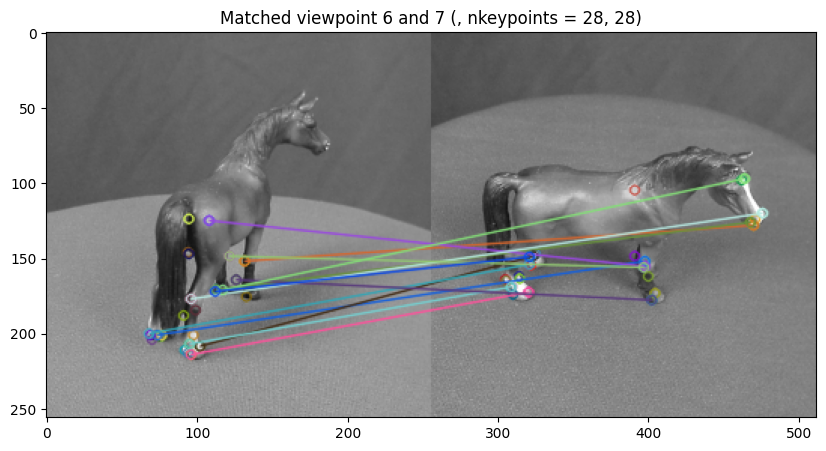

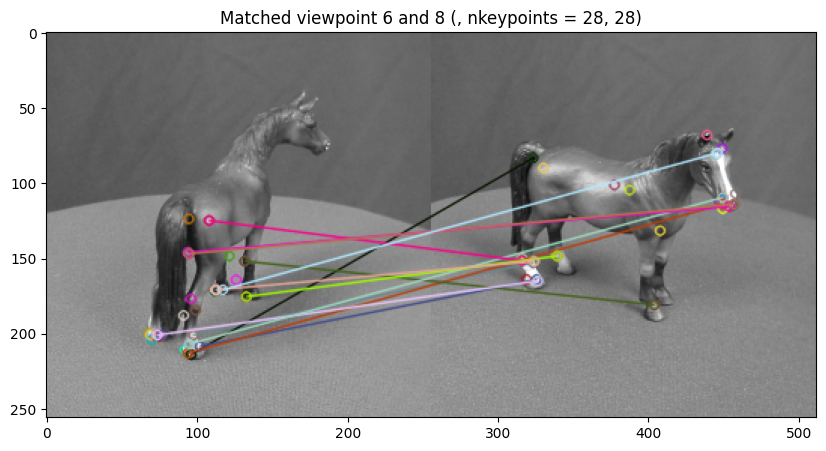

<Figure size 1200x800 with 0 Axes>

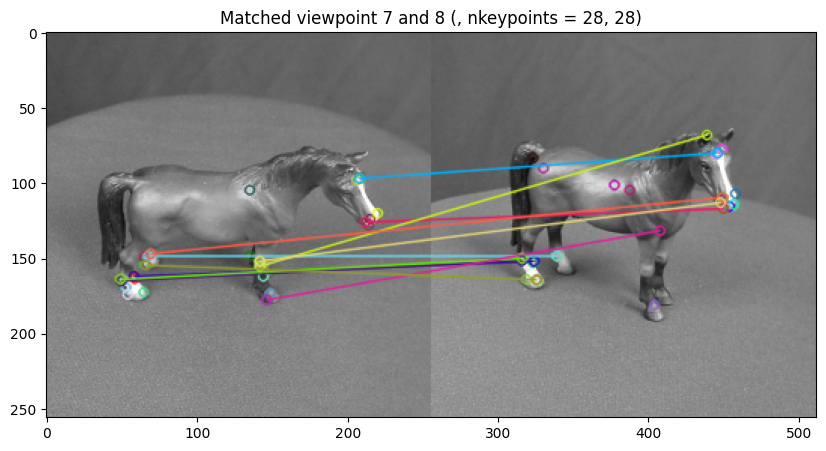

<Figure size 1200x800 with 0 Axes>

In [41]:
for index_1 in range(len(horse1_lst)):
    image1 = horse1_lst[index_1]
    plt.figure(figsize=(12, 8))
    for index_2 in range(len(horse1_lst)):
        image2 = horse1_lst[index_2]
        if index_1 < index_2:
            orb_match_2_images(image1, image2, 30, 1.5, 5, 30)

-   Though the eight viewpoints differences seem not large, most of the images match not good. From all 28 matches, only the pair of viewpoints 2 & 3, and viewpoints 7 & 8 have good matches. 

-   Explain why?
    -   We know that, the ORB algorithm detects keypoints based on the intensity of the pixels. 
    -   When the main detected keypoints (horse head, feet, tail) of two images that are under similar lighting conditions, the algorithm can match two images well.
    -   Otherwise (e.g. horse face has very small pixel intensities in viewpoint 5 and larger intensities in viewpoint 7), the images cannot be matched well by pixel intensity based algorithm. 

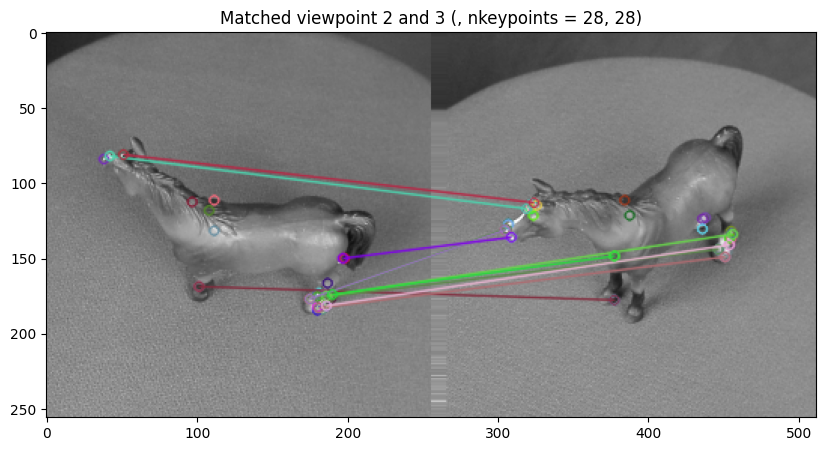

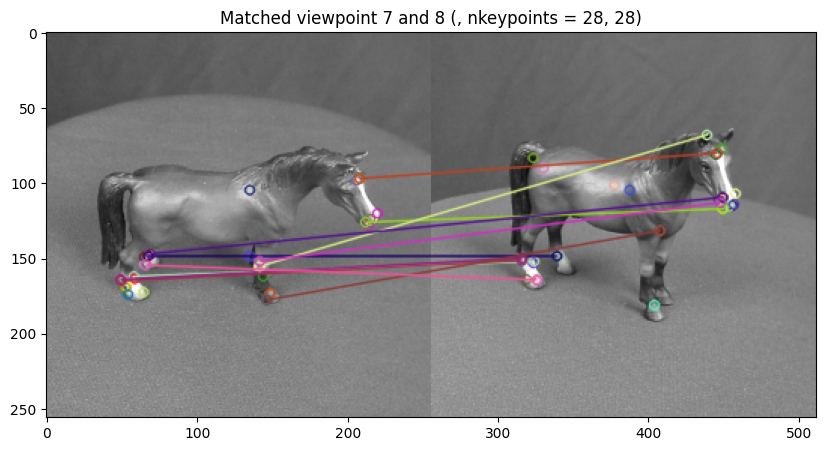

In [42]:
index_1, index_2 = 1, 2
orb_match_2_images(horse1_lst[index_1], horse1_lst[index_2], 30, 1.5, 5, 30)
index_1, index_2 = 6, 7
orb_match_2_images(horse1_lst[index_1], horse1_lst[index_2], 30, 1.5, 5, 30)

## 2.2 Apply ORB method to transformed images

In the upper part, I used the images taken with different viewpoints. ORB can match only a few image pairs. 
I would select one image and apply transformations to change the image appearance, and then check if ORB could match them more efficient.

I will apply rotation, scaling, and shearing along on image 7.

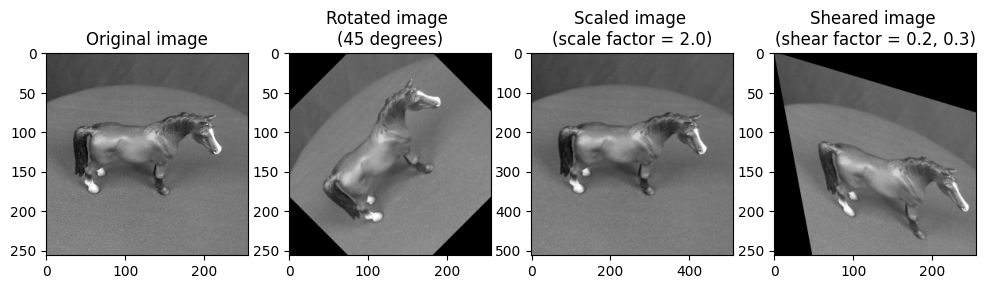

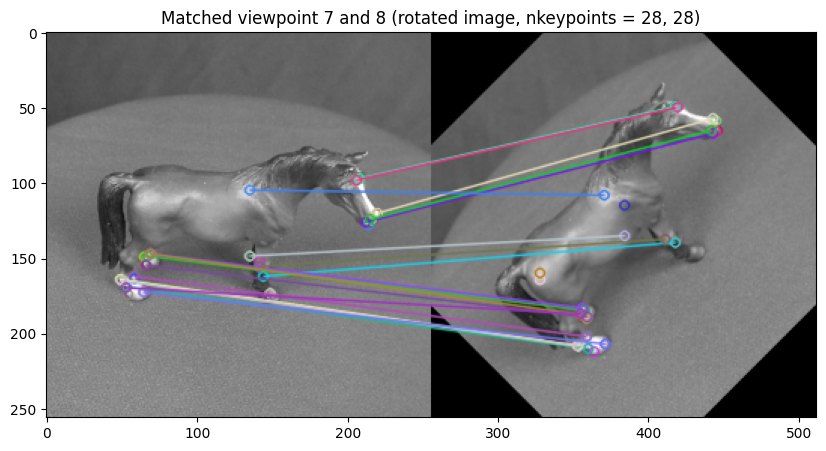

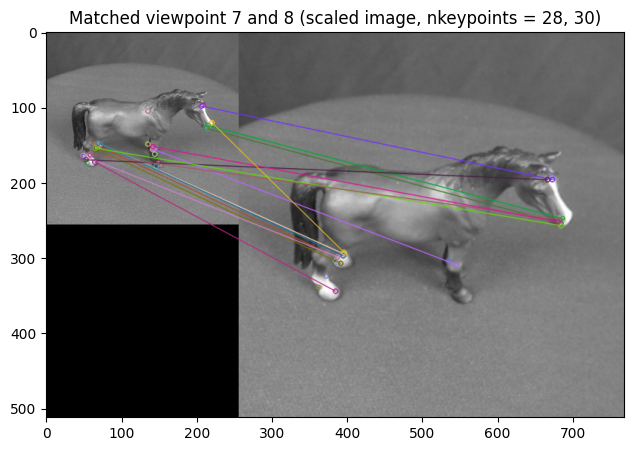

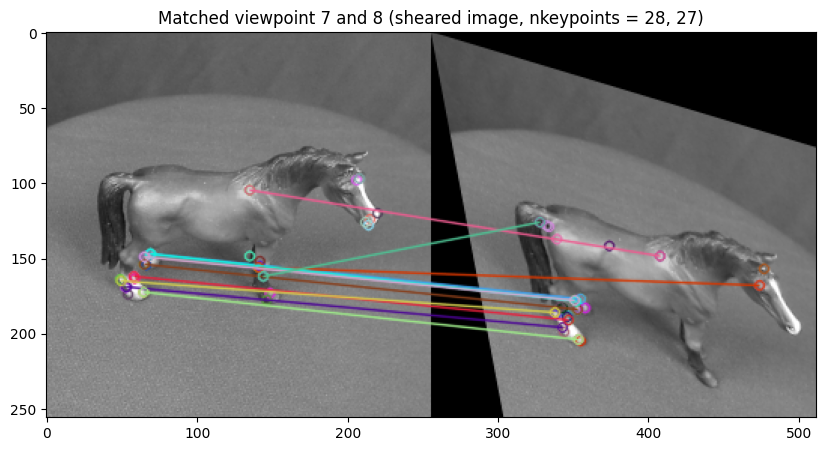

In [43]:
image7 = horse1_lst[6]

# rotation
angle = 45  
height, width = image7.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
rotated_image = cv2.warpAffine(image7, rotation_matrix, (width, height))

# scaling
scale_factor = 2.0 
resized_width = int(image7.shape[1] * scale_factor)
resized_height = int(image7.shape[0] * scale_factor)
scaled_image = cv2.resize(image7, (resized_width, resized_height), interpolation=cv2.INTER_LINEAR)

# shearing
shear_factor_x, shear_factor_y = 0.2, 0.3  

shearing_matrix_x = np.array([[1, shear_factor_x, 0], [0, 1, 0]], dtype=np.float32)
shearing_matrix_y = np.array([[1, 0, 0], [shear_factor_y, 1, 0]], dtype=np.float32)

sheared_image = cv2.warpAffine(image7, shearing_matrix_x, (width, height), borderMode=cv2.BORDER_CONSTANT)
sheared_image = cv2.warpAffine(sheared_image, shearing_matrix_y, (width, height), borderMode=cv2.BORDER_CONSTANT)

# plot
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.imshow(image7, cmap='gray')
plt.title('Original image')
plt.subplot(1, 4, 2)
plt.imshow(rotated_image, cmap='gray')
plt.title(f'Rotated image \n({angle} degrees)')
plt.subplot(1, 4, 3)
plt.imshow(scaled_image, cmap='gray')
plt.title(f'Scaled image \n(scale factor = {scale_factor})')
plt.subplot(1, 4, 4)
plt.imshow(sheared_image, cmap='gray')
plt.title(f'Sheared image \n(shear factor = {shear_factor_x}, {shear_factor_y})')
plt.show()
orb_match_2_images(image7, rotated_image, 30, 1.5, 5, 30, 'rotated image')
orb_match_2_images(image7, scaled_image, 30, 1.5, 5, 30, 'scaled image')
orb_match_2_images(image7, sheared_image, 30, 1.5, 5, 30, 'sheared image')

From the results, we could see that the ORB algorithm is very robust to rotation and scaling. This is because ORB detects and matches keypoints invariant to changes in rotation, scale, and lighting conditions. This is because
-   ORB assigns orientations to keypoints, allowing it to detect and match features even when the image is rotated.
-   ORB uses a pyramid structure to handle different scales, making it robust to scaling transformations. It detects features at the most appropriate scale.


And it can tolerant to shearing, though the performance is not as effectively as to rotating and scaling. Because shearing can distort the local pixel intensities and alter the relationships between keypoints, making feature matching more challenging.


**Summary**
-   ORB exhibits robustness in handling rotation and scaling variations, can effective detect and match features in images with such transformations. 
-   It is tolerant to shearing.  
-   Its performance may largely decrease involving objects with significantly different viewpoints or orientations across images.